# **OURCS@DFW 2021**

# **[Misinfodemic] Tracking COVID-19 Misinformation**

Licensed under the Apache License, Version 2.0 (the "License").

In this workshop we will build machine learning models to detect the stance of tweets toward misinformation and to further catalog the tweets according to a taxonomy of different types of misinformation. Particularly, we will focus on misinformation related to the COVID-19 pandemic and integrate the project outcome in a COVID-19 information dashboard [https://idir.uta.edu/covid-19/](https://idir.uta.edu/covid-19/). Students in the workshop will study the concepts and techniques of natural language processing, text classification and neural networks. They will learn to use various Python libraries such as TensorFlow in building machine learning and deep learning models for stance detection and classifying tweets based on the taxonomy. They will also work on an active research problem that can have important societal impacts.

### Affilication: University of Texas at Arlington, IDIR Lab

### Supervising faculty 
- Chengkai Li (cli@uta.edu)

### TAs
- Fatma Arslan (fatma.dogan@mavs.uta.edu)
- Jacob Devasier (jacob.devasier@mavs.uta.edu)
- Damian Jimenez (damian.jimenez@mavs.uta.edu)
- Xiao Shi (xiao.shi@mavs.uta.edu)
- Haiqi (Penny) Zhang (haiqi.zhang@mavs.uta.edu)
- Zhengyuan (Joey) Zhu (zhengyuan.zhu@mavs.uta.edu

# **Downloading All Required Datasets and Installing Required Packages**

In [ ]:
""" Download all the dataset in this block and install required packages
"""
# Taxonomy: https://drive.google.com/drive/folders/1HmqxUhnayC_n1iCw8FnHcImPdLxEV5SC

# Download vaccine facts
!wget "https://docs.google.com/spreadsheets/d/1sDxe5P7T2MmhUdPJP2KzDN-jnKf3TISBkPtg401VXK8/export?format=csv" -O "vaccine_facts.csv"
# Download taxonomy labelling example:
!wget "https://docs.google.com/spreadsheets/d/1vnjGHNqsQZh-yvNg2-uj0icMkIjquZc30I86RX2j9kk/export?format=csv" -O "taxonomy_example_to_label.csv"
# Download claim matching dataset
!wget "https://docs.google.com/spreadsheets/d/1t4OTaUiDJqMCblQ66yrfrjoTFnxdKo6l4EkWSfPeqFs/export?format=csv" -O "claim_matching.csv"
# Download stance detection dataset
!wget "https://docs.google.com/spreadsheets/d/1oJF5mxSbF1eelDe5iR2RWG5TrggmOKj8WT7g-nPytc8/export?format=csv" -O "stance_detection.csv"

--2021-02-27 05:17:35--  https://docs.google.com/spreadsheets/d/1sDxe5P7T2MmhUdPJP2KzDN-jnKf3TISBkPtg401VXK8/export?format=csv
Resolving docs.google.com (docs.google.com)... 74.125.142.101, 74.125.142.100, 74.125.142.139, ...
Connecting to docs.google.com (docs.google.com)|74.125.142.101|:443... connected.
HTTP request sent, awaiting response... 307 Temporary Redirect
Location: https://doc-0s-2k-sheets.googleusercontent.com/export/l5l039s6ni5uumqbsj9o11lmdc/k9f88vr1k8kk5h0lvbv2ducrbg/1614403055000/118212513918585769166/*/1sDxe5P7T2MmhUdPJP2KzDN-jnKf3TISBkPtg401VXK8?format=csv [following]
--2021-02-27 05:17:35--  https://doc-0s-2k-sheets.googleusercontent.com/export/l5l039s6ni5uumqbsj9o11lmdc/k9f88vr1k8kk5h0lvbv2ducrbg/1614403055000/118212513918585769166/*/1sDxe5P7T2MmhUdPJP2KzDN-jnKf3TISBkPtg401VXK8?format=csv
Resolving doc-0s-2k-sheets.googleusercontent.com (doc-0s-2k-sheets.googleusercontent.com)... 74.125.142.132, 2607:f8b0:400e:c08::84
Connecting to doc-0s-2k-sheets.googleuserconte

In [ ]:
!pip install -U sentence-transformers
!pip install -q tensorflow-text
!pip install -q tf-models-official

Requirement already up-to-date: sentence-transformers in /usr/local/lib/python3.7/dist-packages (0.4.1.2)


# **Part A: Misinformation and "Fake News"**

The creation and propagation of the misinformation (sometimes referred to "fake news") has become an increasingly important issue for our society to tackle.

## **The "Fake News" Problem**
It was always there, since "Yellow Journalism" started in 1890s. 


*   Exaggerated headlines, clickbait, computational propaganda, misinformation, disinformation
*   Snopes.com (1994), Glenn Kessler (1996), FactCheck.org (2003), PolitiFact (2007)


But it became a daily talking point since 2016

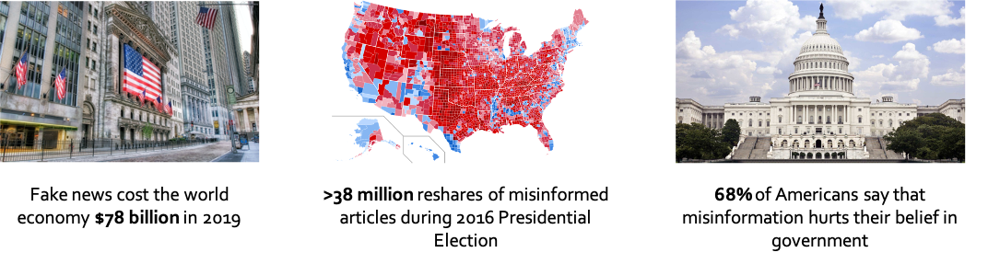

Study from Pew Research Center (https://pewrsr.ch/39PmGeP)

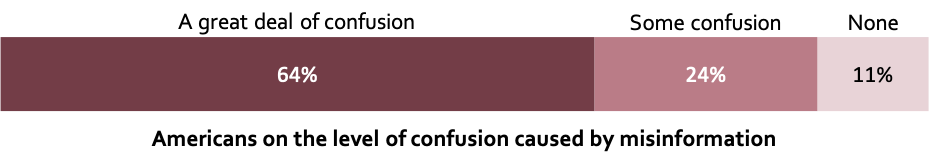

## **Quick Dissemination of Misinformation**

Many falsehoods are spread via mediums that allow rapid dissemination of information, including social media, news outlets, and televised programs. This is a serious impediment to the integrity of our economic, social, and political systems.

## **The Fact-checking Process**
**Fact-checkers:** The Washington Post, PolitiFact, FactCheck.org, The New York Times, ...

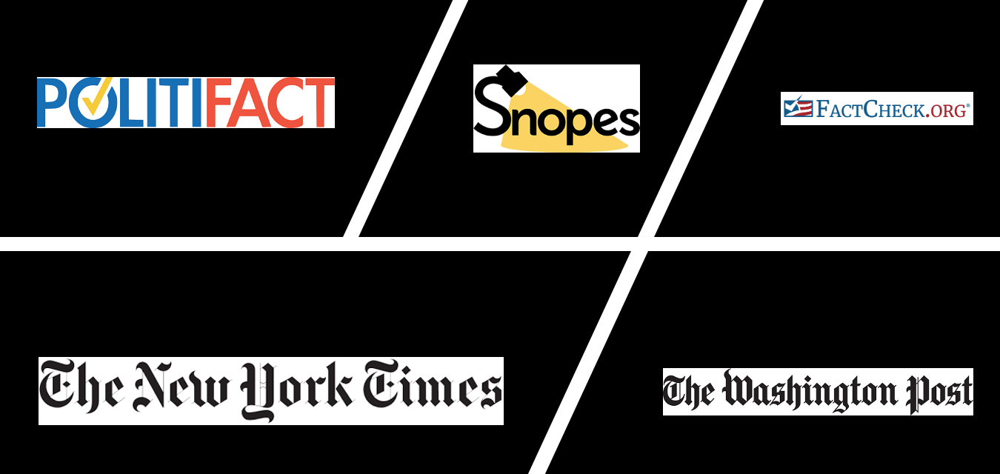

However, current efforts are far from sufficient to fight misinformation at full volume, as they cannot keep up with the explosive spread of misinformation.
* Human fact-checkers spend between 4 hours and 1 day to check one claim (Duke Univ)
* 800 million tweets (30% retweets) posted per day, each potentially with false information

## Fact-checking is Hard

*“… our Navy is smaller than it's been since 1917"*, said Republican candidate Mitt Romney in third presidential debate in 2012.

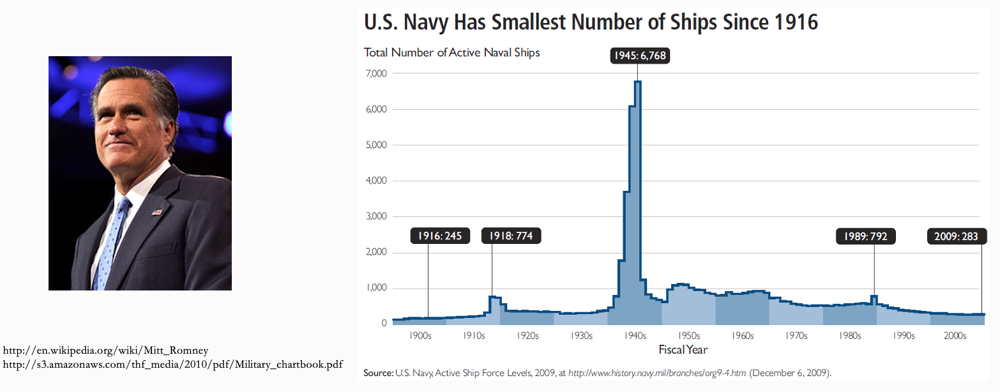

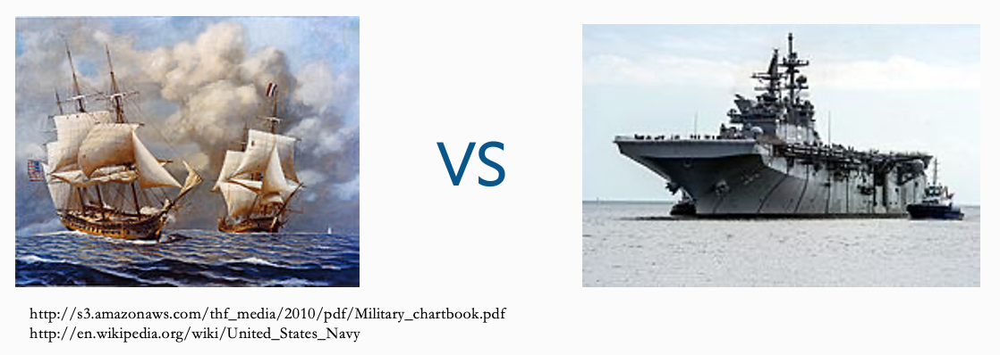

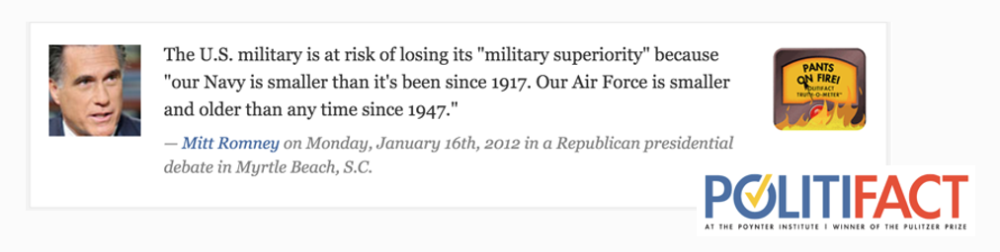

## **ClaimBuster**
### **Toward the Holly Grail of Automated Fact-checking**

PolitiFact “Buffet” of Factual Claims


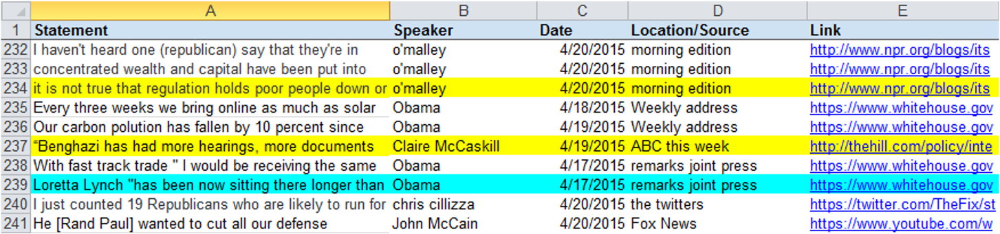

### **Finding Important Factual Claims: A Supervised Learning Task** 

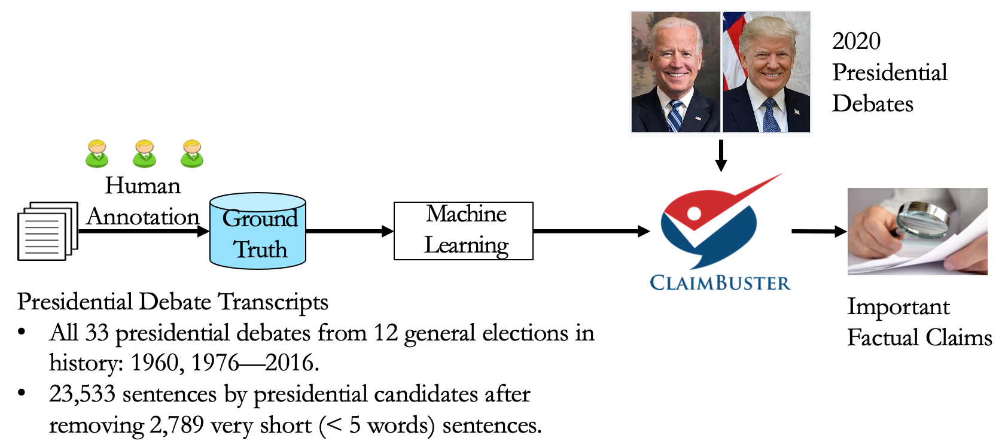

### **Classification and Ranking by Check-worthiness**

### **CFS: Important factual claims**

* “We spend less on the military today than at any time in our history.”     

* “The President’s position on gay marriage has changed.”     

* “More people are unemployed today than four years ago.” 

## **UFS: Unimportant factual claims**

* “I was in Iowa yesterday.”     

* “My mother enjoys cooking.”     

* “I ran for President once before.”

## **NFS: No factual claims (opinions, questions & declarations)**

* “Iran must not get nuclear weapons.”     
* “7% unemployment is too high.”     
* “My opponent is wishy-washy.”     
* “I will be tough on crime.”     
* "Why should we do that?“     
* “Hello, New Hampshire!”     
* “Our plan is to reduce tax rate by 10%.”

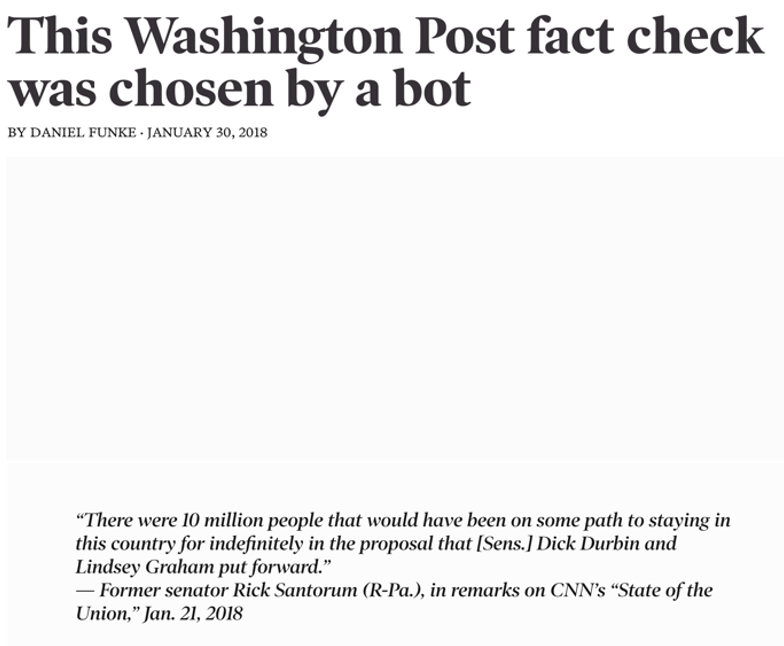

**"I had actually looked at that transcript but I missed that claim," said Glenn Kessler, who runs The Fact Checker. "So it would have been lost to history if it had not been for Claimbuster."**




Duke Reporters’ Lab uses ClaimBuster API in creating daily newsletters that recommend to The Washington Post, New York Times, PolitiFact, and other fact-checkers the most check-worthy claims in CNN programs, Tweets, Facebook posts, and the Congressional Record.

## **ClaimBuster API and Code Repository**

ClaimBuster API: [idir.uta.edu/claimbuster/api/](idir.uta.edu/claimbuster/api/) 

ClaimBuster Code Repository: [github.com/idirlab/claimspotter](github.com/idirlab/claimspotter)

**Let's see ClaimBuster API in action.**

In [ ]:
import requests
import json
from getpass import getpass


# Define the endpoint (url), payload (sentence to be scored), api-key (api-key is sent as an extra header)
api_endpoint = "https://idir.uta.edu/claimbuster/api/v2/score/text/"
request_headers = {"x-api-key": getpass("Enter your API key: ")}
payload = {"input_text": input("Enter a claim: ")}

# Send the POST request to the API and store the api response
api_response = requests.post(url=api_endpoint, json=payload, headers=request_headers)

# Print out the JSON payload the API sent back
print(api_response.json())

### **COVID-19 Misinformation**

* [https://www.politifact.com/factchecks/2020/may/20/facebook-posts/no-specific-covid-19-vaccine-experimental-or-other/](https://www.politifact.com/factchecks/2020/may/20/facebook-posts/no-specific-covid-19-vaccine-experimental-or-other/)
* [https://www.poynter.org/?ifcn_misinformation=covid-19-vaccine-candidates-will-insert-microchips-in-humans](https://www.poynter.org/?ifcn_misinformation=covid-19-vaccine-candidates-will-insert-microchips-in-humans)
* [https://www.poynter.org/?ifcn_misinformation=salty-and-sour-foods-cause-the-body-of-the-covid-19-virus-to-explode-and-dissolve](https://www.poynter.org/?ifcn_misinformation=salty-and-sour-foods-cause-the-body-of-the-covid-19-virus-to-explode-and-dissolve)
* [https://www.poynter.org/?ifcn_misinformation=a-chain-that-circulates-through-whatsapp-that-says-that-the-coronavirus-is-not-a-virus-as-we-have-been-led-to-believe-but-is-a-bacterium-amplified-by-5g-electromagnetic-radiation-that-also-produ](https://www.poynter.org/?ifcn_misinformation=a-chain-that-circulates-through-whatsapp-that-says-that-the-coronavirus-is-not-a-virus-as-we-have-been-led-to-believe-but-is-a-bacterium-amplified-by-5g-electromagnetic-radiation-that-also-produ)
* [https://www.poynter.org/?ifcn_misinformation=fewer-than-100-people-have-died-from-covid-19-in-ireland](https://www.poynter.org/?ifcn_misinformation=fewer-than-100-people-have-died-from-covid-19-in-ireland).
* [https://www.poynter.org/?ifcn_misinformation=world-health-organization-announcing-that-covid-19-is-losing-its-potency](https://www.poynter.org/?ifcn_misinformation=world-health-organization-announcing-that-covid-19-is-losing-its-potency)



# **Part B: Taxonomy**

## **B.1 General Understanding of Taxonomy**

### **Definition of Taxonomy**



*   The science of classification to classify or categorize a collection of objects in a hierarchical manner. 



*   A tree structure of classifications for a given set of objects. 

*   At the top of this structure is a single classification, the root node, that applies to all objects. Nodes below this root are more specific classifications that apply to subsets of the total set of classified objects. 


*   From top to bottom, the class becomes more particular and more specific. 





 




### **Example of Taxonomy**


**Taxonomy of Academic Disciplines**: An academic discipline is a branch of knowledge, taught and researched as part of higher education. The following lists a kind of taxonomy of a few academic disciplines for illustration purposes.













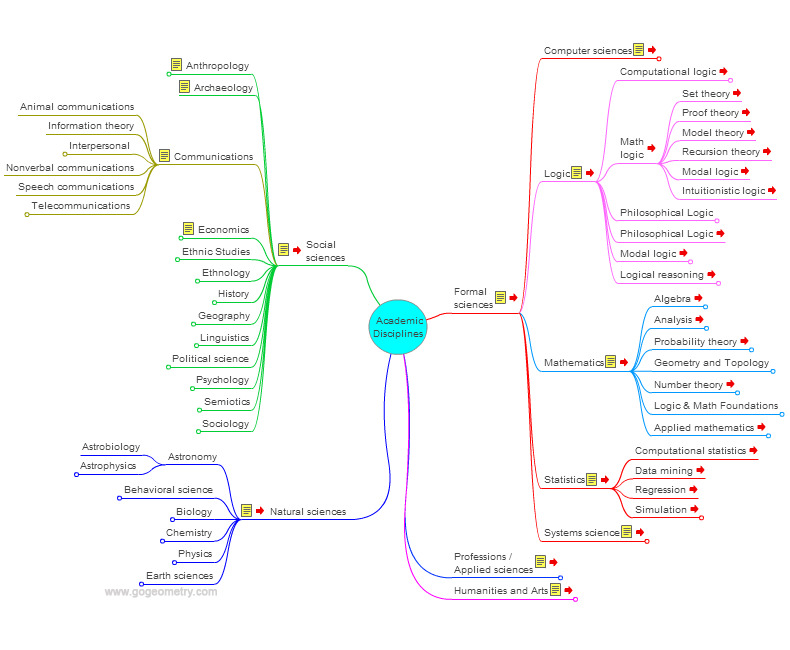

## **B.2 COVID-19 Misinformation Dataset**

### **Our Taxonomy**



*   Manually curated a catalog which currently has 11177 entries from 26 credible websites.
*   Organized the entries into a taxonomy of categories, by integrating and consolidating the available categories from a number of source websites, and  organizing the categories into a hierarchical structure based on their inclusion relationship.

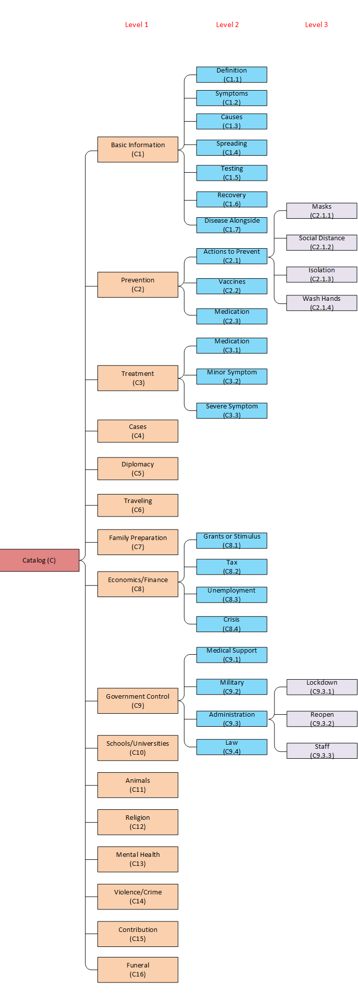

### **Dataset Description**

Four kinds of entries:



*   **Fact-Only Entries**

&emsp;&emsp;&emsp;Statements from authoritative organizations (CDC, WHO, etc)

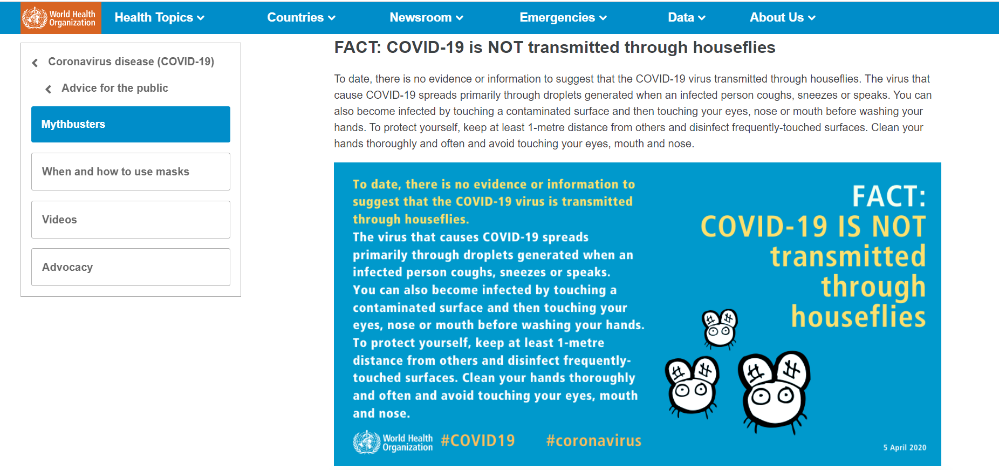

*   **Claim-Debunking Entries**

&emsp;&emsp;&emsp;Verdicts, debunks, and explanations of (potentially false) factual claims from fact-checking websites (Poynter, PolitiFact, etc)

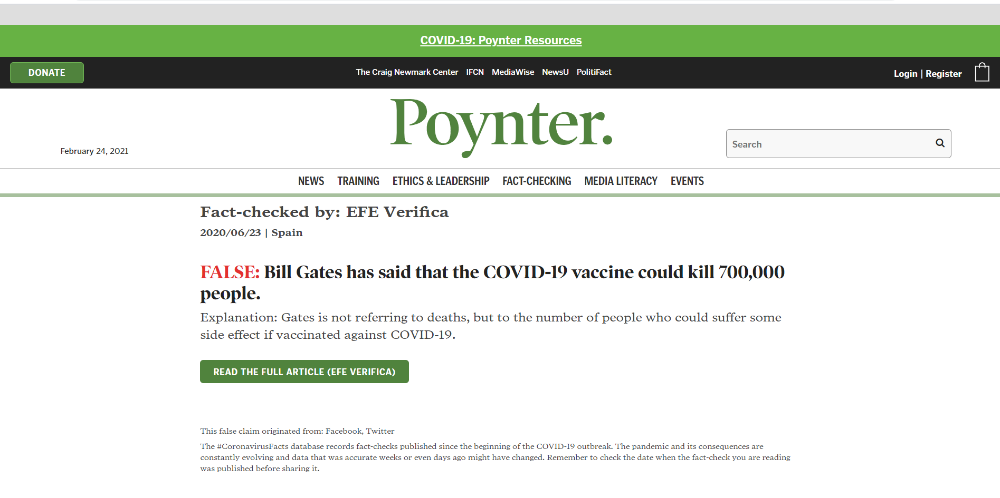

*   **Question-Answer Entries**

&emsp;&emsp;&emsp;FAQs from credible sources (FDA, NYT, etc)

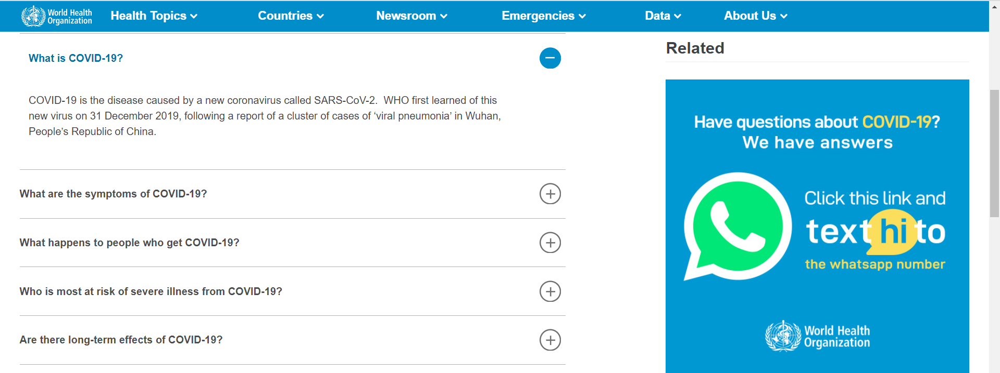

*   **Question-Only Entries**

&emsp;&emsp;&emsp;Questions from search engines and Q&A Platforms (Bing Search, Quora, etc)

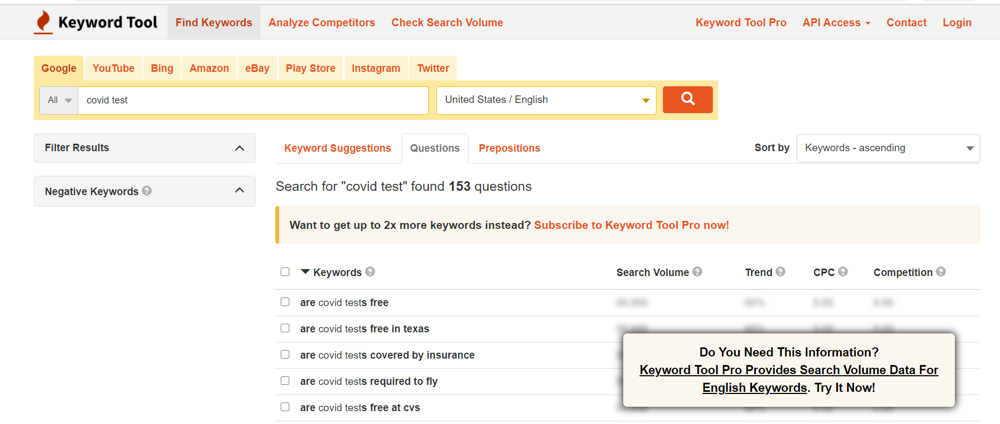

### Dataset Details

All data files are Excel files. Each excel file stores data from one data source.  Each row in the file is an entry. There are 4 kinds of entries put in 4 different folders. The detailed description of the 4 kinds of entries is listed below.  

**Fact-Only Entries**

*These entries are only facts from different data sources. The columns that belong to these entries are:*  

* "Fact/Summary": The fact related to COVID-19 from authoritative websites. 

* "Source": The website that we find the fact.

* "Taxonomy": The taxonomy/class of the fact. The taxonomy is labelled like C2.1.1, the meaning of the taxonomy is shown in file taxonomy.vsdx. 

* "Retrieval Date": The date when the entry was retrieved. 

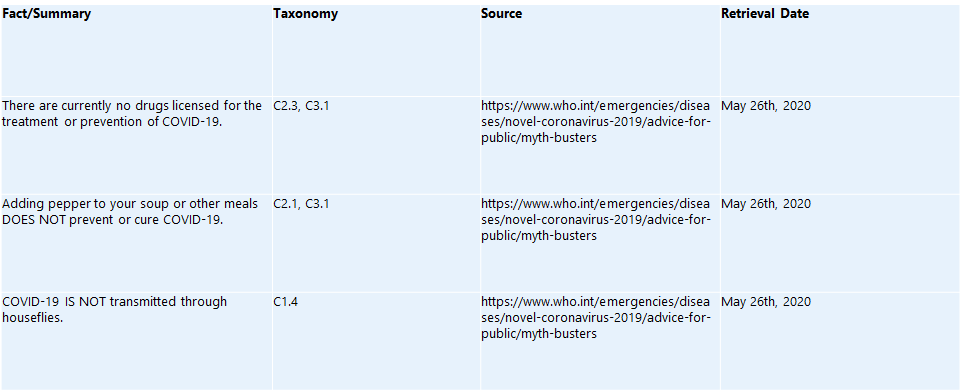

**Claim-Debunking Entries**

*These entries are mostly misleading claims or myth, and most of which are collected from fact-checking websites. The columns that belong to Claim Debunking entries are:*

* "Outlet": The platform/organization that posted the fact-checking result of the claim. 

* "Claimer": The person/platform that the claim appears. 

* "Claim": The claim made by the claimer. 

* "Verdict": The judgement or decision given by the Fact-Checker/ Outlet to the claim. 

* "Fact/Summary": The summary of the related facts to the claim.  

* "Answer/Detail": The detail of the related facts to the claim. Can be pure text or a link to a debunking article. 

* "Taxonomy": The taxonomy/class of the claim. The taxonomy is labelled like C2.1.1, the meaning of the taxonomy is shown in file taxonomy.vsdx. 

* "Source": The url of the data source website of the entry. 

* "Retrieval Date": The date when the entry was retrieved. 

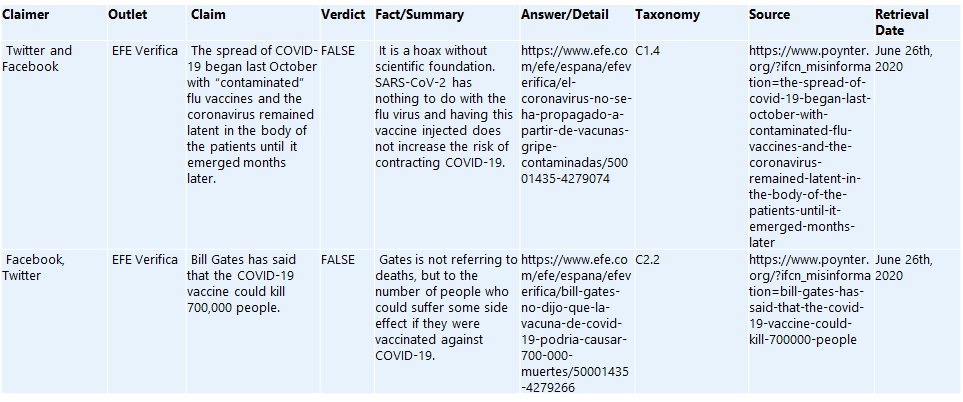

**Question-Answer Entries**

*These entries are all question-answer pairs collected from different data sources. The columns that belong to these entries are:* 

* "Question": The question related to COVID-19. 

* "Fact/Summary": The summary of the original answer to the question. It can be regarded as the direct answer to the question.  

* "Answer/Detail": The original answer to the question on the data source website, and it can be very long. If the original answer is very short, it will be put into the “Fact/Summary” column and will not appear in “Answer/Detail” Column. 

* "Source": The url of the data source website or pure text (Excel files whose names end with “_paper.xlsx” whose “Source” is pure text, others are urls). 

* "Taxonomy": The taxonomy/class of the question. The taxonomy is labelled like C2.1.1, the meaning of the taxonomy is shown in file taxonomy.vsdx. 

* "Retrieval Date": The date when the entry was retrieved

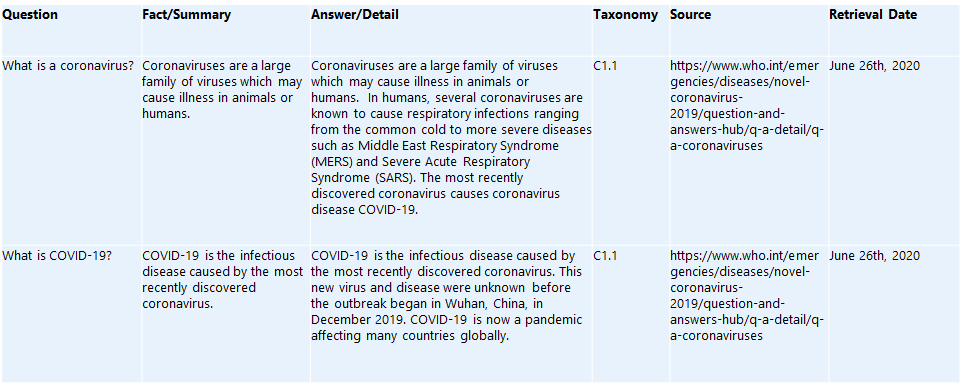

**Question-Only Entries**

*These entries are only questions related to COVID-19. They are all from the dataset of the paper [What Are People Asking About COVID-19? A Question Classification Dataset](https://openreview.net/forum?id=qd51R0JNLl) [3] The columns that belong to these entries are:*

* "Question": The question related to COVID-19. 

* "Source": The data source of the questions, it is pure text provided by the paper’s dataset. 

* "Taxonomy": The taxonomy/class of the question. The taxonomy is labelled like C2.1.1, the meaning of the taxonomy is shown in file taxonomy.vsdx. 

* "Retrieval Date": The date when the entry was retrieved. 

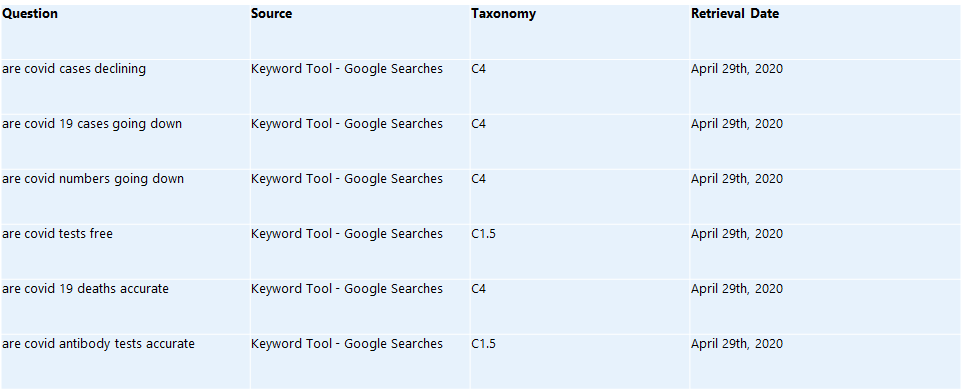

###**Dataset Statistics** 

(Poynter, 7480), (PolitiFact, 454), (Coronavirus.gov, 435), (WHO, 307), (CDC, 295), (NYT, 119), (CNN, 65), (FDA, 60), (Global Health Now, 59), (ECDC, 47), (Washington Post, 35), (United Nations, 25), (COVID-19 FactCheck, 23), (World Vision, 20), (IDPH, 20), (FEMA, 17), (WJLA, 16), (News Guard, 13), (Johns Hopkins, 12), (Doctors Without Border, 6), (Johns Hopkins Medicine, 4), (Bing Search, 91), (Keyword Tool, 347), (Quora, 1048), (Yahoo, 128), (Yahoo Answers, 51)

## **B.3 Hands-on exercise of crowdsourcing the construction of COVID-19 taxonomy**



### **B.3.1 Crowdsource to construct a taxonomy**



**Steps of developing a taxonomy**
1. Gather information
2. Design and build draft taxonomy
3. Review, validate, and revise the taxonomy
4. Taxonomy maintenance


**Design and build draft taxonomy**
1. Discover/extract concepts
    * Assign key words (categories) to each object
2. Organize categories
    * Two approaches: 
        * Top down (from users or stakeholders)
        * Bottom up (from sample content)
    * Integrate in the middle
    * Note: terms can be revised in the process


Reference: http://accidental-taxonomist.blogspot.com/2019/02/taxonomy-building-steps.html#:~:text=The%20main%20steps%20in%20developing,The%20steps%20may%20overlap%20slightly.


**Practice: construct a taxonomy based on the categories of vaccine**

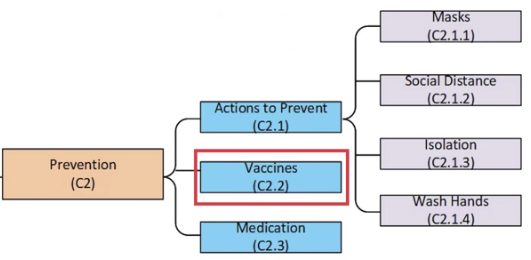

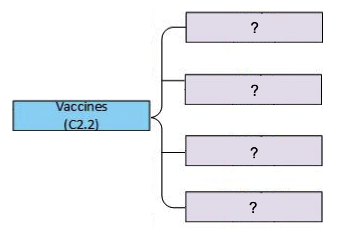

[Practice: Assign key words to vaccine-related facts](https://forms.gle/NWNM45AD23s2NEYY9)

### **B.3.2 Assign objects to the taxonomy**

[Practice: Assign objects to the taxonomy categories](https://forms.gle/adwcZmypmvo2j3937)

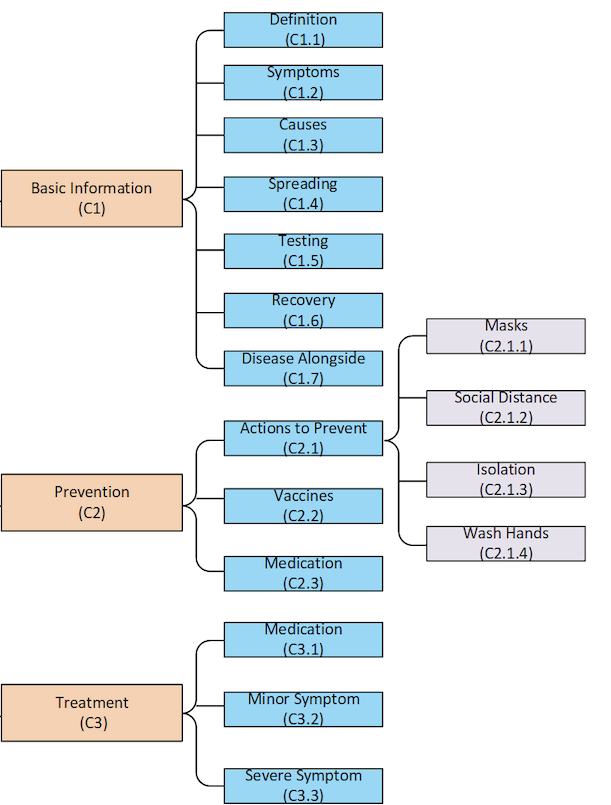

# **Part C: Introduction to Text Classification**


### **Spam Detection**

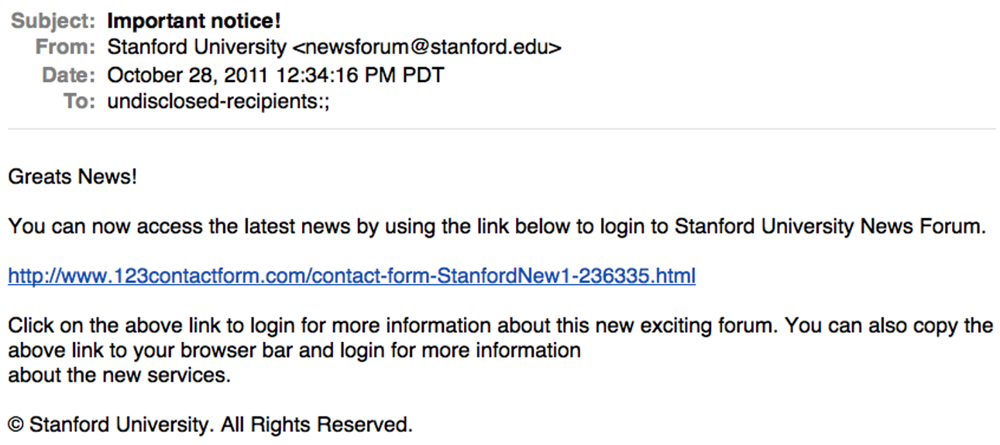

### **Sentiment Analysis**

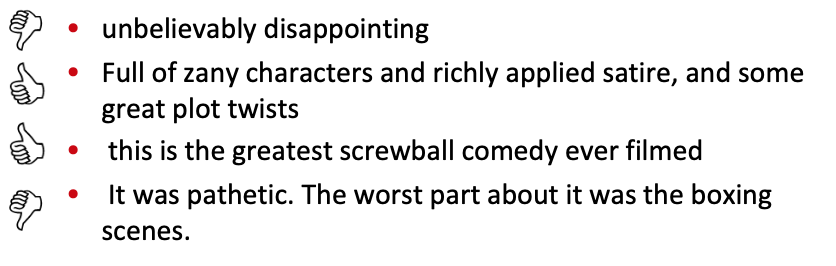

### **Authorship Attribution**

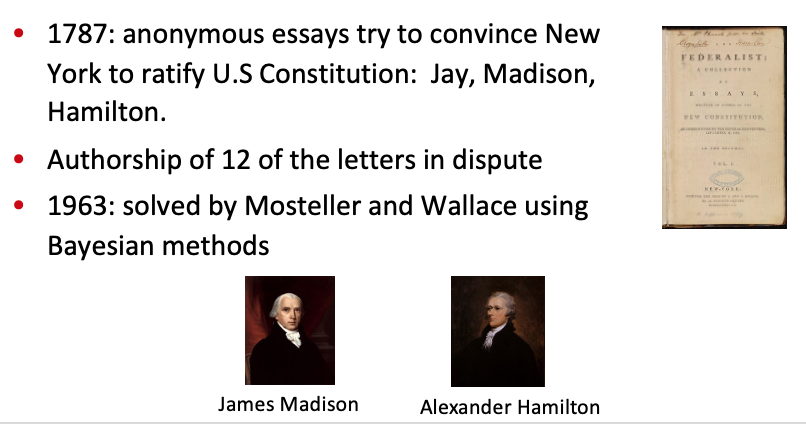

### **Topic Detection**

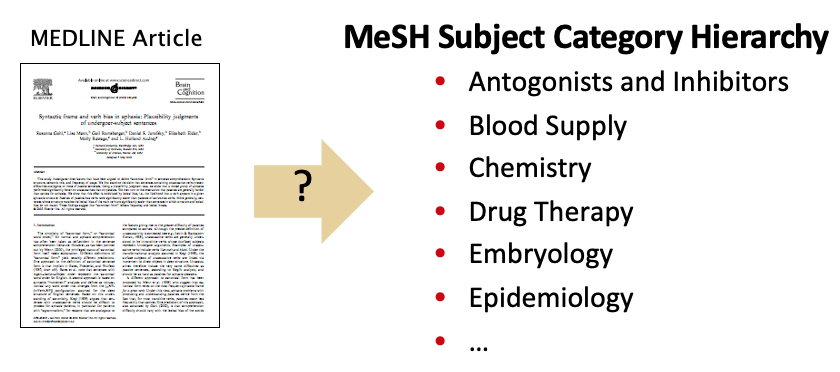

### **C.1 Background and Basic Concept**

[Text classification](https://monkeylearn.com/what-is-text-classification/) also known as text tagging or text categorization is the process of categorizing text into organized groups. By using Natural Language Processing (NLP), text classifiers can automatically analyze text and then assign a set of pre-defined tags or categories based on its content.

A commonly used workflow is shown below:
1. Data preparation
2. Text preprocessing
3. Create model
4. Train and evaluate models
5. Inference by trained model

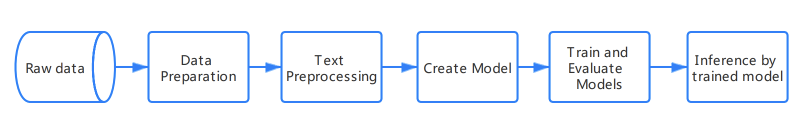

In the next section you will train a binary classifier to perform sentiment analysis on an IMDB dataset. You will use the workflow above and it will benefit your final presentation!

First, you need to import a few packages for later use:

In [ ]:
import matplotlib.pyplot as plt
import os
import re
import shutil
import string
import tensorflow as tf

from tensorflow.keras import layers
from tensorflow.keras import losses
from tensorflow.keras import preprocessing
from tensorflow.keras.layers.experimental.preprocessing import TextVectorization

### C.2 Data Preparation

You'll use the IMDB dataset that contains the text of 50,000 movie reviews from the Internet Movie Database. These are split into 25,000 reviews for training and 25,000 reviews for testing. 

The training and testing sets are balanced, meaning they contain an equal number of positive and negative reviews. Note that the labels are 1 or 0. To see which of these correspond to positive and negative movie reviews, you can check the class_names property on the dataset.

In [ ]:
url = "https://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz"
dataset = tf.keras.utils.get_file("aclImdb_v1.tar.gz", url, untar=True, cache_dir='.', cache_subdir='')
dataset_dir = os.path.join(os.path.dirname(dataset), 'aclImdb')

train_dir = os.path.join(dataset_dir, 'train')
sample_file = os.path.join(train_dir, 'pos/1181_9.txt')
remove_dir = os.path.join(train_dir, 'unsup')
try: shutil.rmtree(remove_dir)
except: print('the directory unsup is already removed')

84131840/84125825 [==============================] - 4s 0us/step


When running a machine learning experiment, it is a best practice to divide your dataset into three splits: [train](https://developers.google.com/machine-learning/glossary#training_set), [validation](https://developers.google.com/machine-learning/glossary#validation_set), and [test](https://developers.google.com/machine-learning/glossary#test-set). 

The IMDB dataset has already been divided into train and test, but it lacks a validation set. Let's create a validation set using an 80:20 split of the training data by using the `validation_split` argument below.

#### Train, test, and validation split

When training any machine learning model, it is important to set aside some of our data for testing the performance of the model once it is finished training.

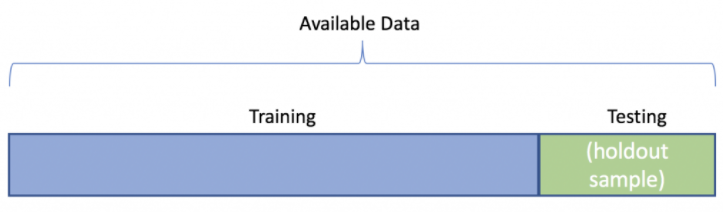

While training, we would also like to evaluate the performance of our model in real time instead of waiting for the model to finish and getting the results from the testing split. To solve this problem, we reserve some more of the training data into a validation set.

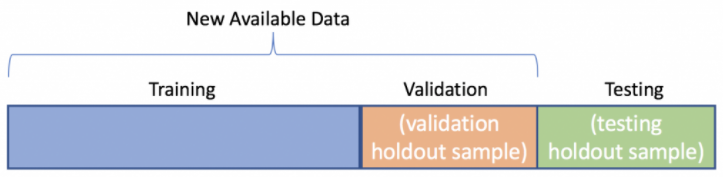

In [ ]:
batch_size = 32
seed = 42
raw_train_ds = tf.keras.preprocessing.text_dataset_from_directory('aclImdb/train',  batch_size=batch_size, validation_split=0.2, subset='training', seed=seed)
raw_val_ds = tf.keras.preprocessing.text_dataset_from_directory('aclImdb/train', batch_size=batch_size, validation_split=0.2, subset='validation', seed=seed)
raw_test_ds = tf.keras.preprocessing.text_dataset_from_directory('aclImdb/test', batch_size=batch_size)

for text_batch, label_batch in raw_train_ds.take(1):s
  for i in range(3):
    print("Review", text_batch.numpy()[i])
    print("Label", label_batch.numpy()[i])
print("Label 0 corresponds to", raw_train_ds.class_names[0])
print("Label 1 corresponds to", raw_train_ds.class_names[1])

Found 25000 files belonging to 2 classes.
Using 20000 files for training.
Found 25000 files belonging to 2 classes.
Using 5000 files for validation.
Found 25000 files belonging to 2 classes.
Review b'"Pandemonium" is a horror movie spoof that comes off more stupid than funny. Believe me when I tell you, I love comedies. Especially comedy spoofs. "Airplane", "The Naked Gun" trilogy, "Blazing Saddles", "High Anxiety", and "Spaceballs" are some of my favorite comedies that spoof a particular genre. "Pandemonium" is not up there with those films. Most of the scenes in this movie had me sitting there in stunned silence because the movie wasn\'t all that funny. There are a few laughs in the film, but when you watch a comedy, you expect to laugh a lot more than a few times and that\'s all this film has going for it. Geez, "Scream" had more laughs than this film and that was more of a horror film. How bizarre is that?<br /><br />*1/2 (out of four)'
Label 0
Review b"David Mamet is a very intere

### C.3 Text preprocessing
To preprocess to IMDB review dataset, you will standardize, tokenize, and vectorize the data using the helpful `preprocessing.TextVectorization` layer. 

As you saw above, the reviews contain various HTML tags like `<br />`. These tags will not be removed by the default standardizer in the `TextVectorization` layer (which converts text to lowercase and strips punctuation by default, but doesn't strip HTML). You will write a custom standardization function to remove the HTML.

In [ ]:
max_features = 10000
sequence_length = 250

def custom_standardization(input_data):
  lowercase = tf.strings.lower(input_data)
  stripped_html = tf.strings.regex_replace(lowercase, '<br />', ' ')
  return tf.strings.regex_replace(stripped_html, '[%s]' % re.escape(string.punctuation), '')

def vectorize_text(text, label):
  text = tf.expand_dims(text, -1)
  return vectorize_layer(text), label

vectorize_layer = TextVectorization(standardize=custom_standardization, max_tokens=max_features, output_mode='int', output_sequence_length=sequence_length)

train_text = raw_train_ds.map(lambda x, y: x)
vectorize_layer.adapt(train_text)

train_ds = raw_train_ds.map(vectorize_text)
val_ds = raw_val_ds.map(vectorize_text)
test_ds = raw_test_ds.map(vectorize_text)

AUTOTUNE = tf.data.AUTOTUNE
train_ds = train_ds.cache().prefetch(buffer_size=AUTOTUNE)
val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)
test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

### C.4 Create model
There are machine learning classification models:
1. Logistic Regression
2. K-Nearest Neighbor(KNN)
3. Naive Bayes
4. Random Forest
5. **Aritificial Neutral Networks**

We are creating a **artificial neural network** model as a classifier. You can consider it as a black box right now and you will learn the details in the upcoming lecture!

In the code example below, the input data consists of sentences. The labels to predict are either 0 or 1.

One way to represent the text is to convert sentences into embeddings vectors. We can use a pre-trained text embedding as the first layer.

In [ ]:
# create a sequential model
model = tf.keras.Sequential([
  layers.Embedding(max_features + 1, 16),
  layers.Dropout(0.2),
  layers.GlobalAveragePooling1D(),
  layers.Dropout(0.2),
  layers.Dense(1)])

model.summary()
# Define loss function and optimizer
model.compile(loss=losses.BinaryCrossentropy(from_logits=True), optimizer='adam', metrics=tf.metrics.BinaryAccuracy(threshold=0.0))

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding (Embedding)        (None, None, 16)          160016    
_________________________________________________________________
dropout (Dropout)            (None, None, 16)          0         
_________________________________________________________________
global_average_pooling1d (Gl (None, 16)                0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 16)                0         
_________________________________________________________________
dense (Dense)                (None, 1)                 17        
Total params: 160,033
Trainable params: 160,033
Non-trainable params: 0
_________________________________________________________________


### C.5 Train and evaluate model
You will train the model by passing the `dataset` object to the fit method.

And let's see how the model performs. Two values will be returned. Loss (a number which represents our error, lower values are better), and accuracy.

>Evaluation Metrics

* **Precision** - Indicates the proportion of positive identifications (model predicted class 1) which were actually correct. A model which produces no false positives has a precision of 1.0.
* **Recall** - Indicates the proportion of actual positives which were correctly classified. A model which produces no false negatives has a recall of 1.0.
* **F1 score** - A combination of precision and recall. A perfect model achieves an F1 score of 1.0.
* **Accuracy** - The accuracy of the model in decimal form. Perfect accuracy is equal to 1.0.

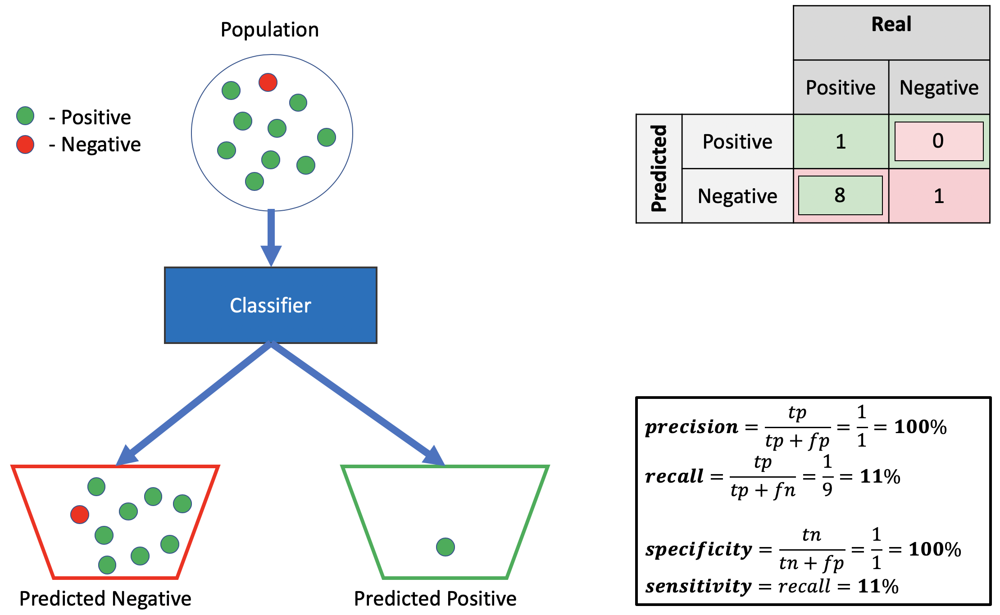

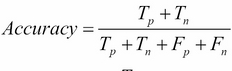

In [ ]:
epochs = 10
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs)

loss, accuracy = model.evaluate(test_ds)
print("Loss: ", loss)
print("Accuracy: ", accuracy)

Epoch 1/10
625/625 [==============================] - 12s 16ms/step - loss: 0.6823 - binary_accuracy: 0.6125 - val_loss: 0.6134 - val_binary_accuracy: 0.7710
Epoch 2/10
625/625 [==============================] - 3s 5ms/step - loss: 0.5778 - binary_accuracy: 0.7864 - val_loss: 0.4971 - val_binary_accuracy: 0.8220
Epoch 3/10
625/625 [==============================] - 3s 5ms/step - loss: 0.4647 - binary_accuracy: 0.8378 - val_loss: 0.4194 - val_binary_accuracy: 0.8472
Epoch 4/10
625/625 [==============================] - 3s 5ms/step - loss: 0.3897 - binary_accuracy: 0.8609 - val_loss: 0.3732 - val_binary_accuracy: 0.8610
Epoch 5/10
625/625 [==============================] - 3s 5ms/step - loss: 0.3429 - binary_accuracy: 0.8779 - val_loss: 0.3446 - val_binary_accuracy: 0.8676
Epoch 6/10
625/625 [==============================] - 3s 5ms/step - loss: 0.3092 - binary_accuracy: 0.8872 - val_loss: 0.3258 - val_binary_accuracy: 0.8724
Epoch 7/10
625/625 [==============================] - 3s 5ms/s

### C.6 Inference by trained model
Let's try out our loaded model on some review examples and see how the classifier scores them. First we need to export the model, in the code above you applied the `TextVectorization` layer to the dataset before feeding text to the model. If you want to make your model capable of processing raw strings (for example, to simplify deploying it), you can include the `TextVectorization` layer inside your model. To do so, you can create a new model using the weights you just trained.

In [ ]:
export_model = tf.keras.Sequential([
  vectorize_layer,
  model,
  layers.Activation('sigmoid')
])

export_model.compile(
    loss=losses.BinaryCrossentropy(from_logits=False), optimizer="adam", metrics=['accuracy']
)

loss, accuracy = export_model.evaluate(raw_test_ds)
print(accuracy)

782/782 [==============================] - 10s 12ms/step - loss: 0.3097 - accuracy: 0.8755
0.8740800023078918


Then you can inference on new data. To get predictions for new examples, you can simply call `model.predict()`.

In [ ]:
examples = [
  "The movie was great!",
  "The movie was okay.",
  "The movie was terrible..."
]

export_model.predict(examples)

array([[0.6248977 ],
       [0.44696915],
       [0.3662186 ]], dtype=float32)

Reference: https://colab.research.google.com/github/tensorflow/docs/blob/master/site/en/tutorials/keras/text_classification.ipynb#scrollTo=eSSuci_6nCEG

# **Part D: Deep learning - Classifying Text Using BERT**

#### Source: `https://www.tensorflow.org/tutorials/text/classify_text_with_bert`
#### More Resources:
  - https://ujjwalkarn.me/2016/08/11/intuitive-explanation-convnets/
  - https://missinglink.ai/guides/convolutional-neural-networks/fully-connected-layers-convolutional-neural-networks-complete-guide/
  - https://www.cs.toronto.edu/~tingwuwang/rnn_tutorial.pdf
  - https://colah.github.io/posts/2015-08-Understanding-LSTMs/
  - http://karpathy.github.io/2015/05/21/rnn-effectiveness/
  - http://jalammar.github.io/illustrated-transformer/


### Word Embeddings

Much like you cannot look at a word written in a foreign language, computers cannot look at a word in english and know what it means. 

We can teach computers what rules words follow and their similarities, but it is hard to tell if the computer really understands what it is reading or saying. See Alan Turing's Turing test and John Searle's chinese room argument.

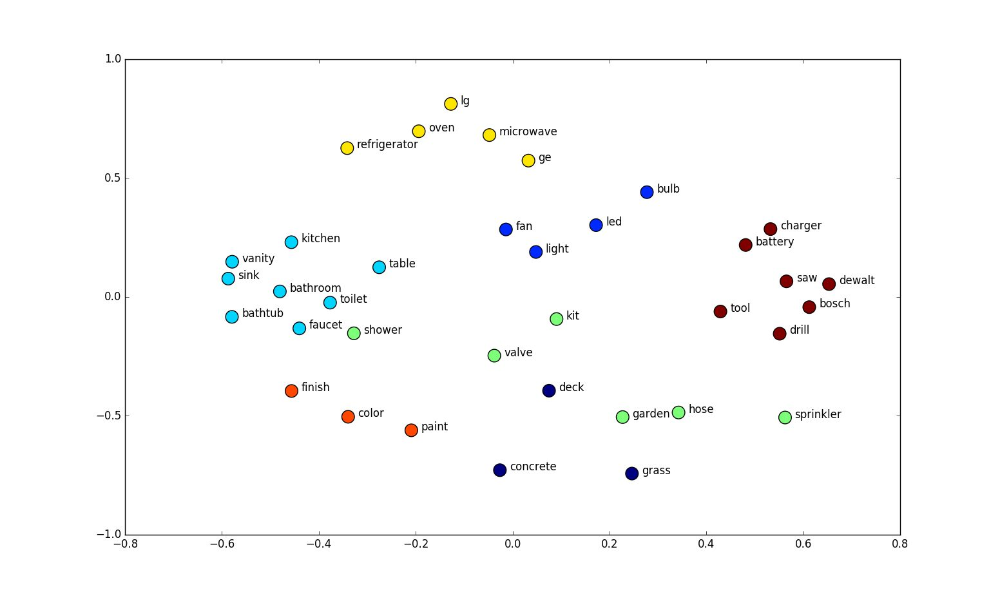

Word embeddings are a numerical representation of words. You can see from the image above that similar words tend to be grouped aroudn each other, i.e. the light blue group is related to bathroom/kitchen things, yellow is related to appliances, brown is tools, red is painting, and so on. 

We can also see that the two words `color` and `dewalt` are quite unrelated as they are very far apart, while words like `vanity` and `sink` are very close together as they are very similar.

We expect that a good word embedding will place similar words next to each other and dissimilar words far from each other in any n-dimensional space.

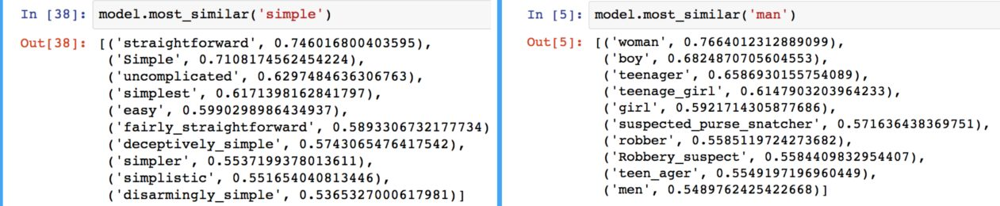

### Installing Pre-Requisites
First we will install some dependencies using pip which is the package manager for Python and makes it easy to install any packages/libraries that are in the Python Package Index (PyPI). You don't need to install Tensorflow or some other related packes when working in Colab, but if you want to attempt this on your own machine you will need to install these as well. There are several tutorials online on how to get them installed depending on the OS you are running on your personal laptops/desktops.

In [ ]:
# A dependency of the preprocessing for BERT inputs
!pip install -q tensorflow-text
!pip install -q tf-models-official
!pip install -q scipy
!pip install -q scikit-learn

     |████████████████████████████████| 3.4MB 5.6MB/s 
     |████████████████████████████████| 1.1MB 5.4MB/s 
     |████████████████████████████████| 102kB 7.6MB/s 
     |████████████████████████████████| 706kB 11.9MB/s 
     |████████████████████████████████| 1.2MB 11.4MB/s 
     |████████████████████████████████| 174kB 23.2MB/s 
     |████████████████████████████████| 358kB 23.5MB/s 
     |████████████████████████████████| 645kB 29.7MB/s 
     |████████████████████████████████| 51kB 6.3MB/s 
     |████████████████████████████████| 37.6MB 1.2MB/s 


### Import the Packages
Once our packages are installed we can import them in our code as follows.

In [ ]:
import os
import shutil

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optmizer
import sklearn.metrics as mt

import matplotlib.pyplot as plt

tf.get_logger().setLevel('ERROR')

### Download the dataset
This dataset contains 50,000 movie reviews for natural language processing. It is used for sentiment classification, where the goal is to predict whether a review is talking about a movie positively or negatively. 

In [ ]:
url = 'https://ai.stanford.edu/~amaas/data/sentiment/aclImdb_v1.tar.gz'

dataset = tf.keras.utils.get_file('aclImdb_v1.tar.gz', url,
                                  untar=True, cache_dir='.',
                                  cache_subdir='')

dataset_dir = os.path.join(os.path.dirname(dataset), 'aclImdb')

train_dir = os.path.join(dataset_dir, 'train')

# remove unused folders to make it easier to load the data
remove_dir = os.path.join(train_dir, 'unsup')
shutil.rmtree(remove_dir)

84131840/84125825 [==============================] - 7s 0us/step


Below, you can also see that we have a variable called  `batch_size`. Batch size refers to the number of data samples we want to train our model on at once. Since our data can be very large and our RAM is limited, it is often necessary to split up our data into small chunks to allow the CPU to process them. 

We choose a batch size of `32`, but like many things in machine learning, this is typically an arbitrary value that changes based on the dataset and model. 

In [ ]:
AUTOTUNE = tf.data.AUTOTUNE
batch_size = 32
seed = 42

raw_train_ds = tf.keras.preprocessing.text_dataset_from_directory(
    'aclImdb/train',
    batch_size=batch_size,
    validation_split=0.2,
    subset='training',
    seed=seed)

class_names = raw_train_ds.class_names
train_ds = raw_train_ds.cache().prefetch(buffer_size=AUTOTUNE)

val_ds = tf.keras.preprocessing.text_dataset_from_directory(
    'aclImdb/train',
    batch_size=batch_size,
    validation_split=0.2,
    subset='validation',
    seed=seed)

val_ds = val_ds.cache().prefetch(buffer_size=AUTOTUNE)

test_ds = tf.keras.preprocessing.text_dataset_from_directory(
    'aclImdb/test',
    batch_size=batch_size)

test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

Found 25000 files belonging to 2 classes.
Using 20000 files for training.
Found 25000 files belonging to 2 classes.
Using 5000 files for validation.
Found 25000 files belonging to 2 classes.


Let's take a peek inside the dataset and see some examples of the data we are working with.

In [ ]:
for text_batch, label_batch in train_ds.take(1):
    for i in range(3):
        print(f'Review: {text_batch.numpy()[i]}')
        label = label_batch.numpy()[i]
        print(f'Label : {label} ({class_names[label]})')

Review: b'"Pandemonium" is a horror movie spoof that comes off more stupid than funny. Believe me when I tell you, I love comedies. Especially comedy spoofs. "Airplane", "The Naked Gun" trilogy, "Blazing Saddles", "High Anxiety", and "Spaceballs" are some of my favorite comedies that spoof a particular genre. "Pandemonium" is not up there with those films. Most of the scenes in this movie had me sitting there in stunned silence because the movie wasn\'t all that funny. There are a few laughs in the film, but when you watch a comedy, you expect to laugh a lot more than a few times and that\'s all this film has going for it. Geez, "Scream" had more laughs than this film and that was more of a horror film. How bizarre is that?<br /><br />*1/2 (out of four)'
Label : 0 (neg)
Review: b"David Mamet is a very interesting and a very un-equal director. His first movie 'House of Games' was the one I liked best, and it set a series of films with characters whose perspective of life changes as they

### Choosing a Model
We will be working with a small variant of BERT since they are faster to train. Also, sometimes when working with the larger variants, if your dataset is not large enough then the model will not converge.

BERT was introduced at the end of 2018 and was a ground-breaking achievement. Since then, many variants of BERT have been proposed for improving performance in certain ways. 

[Here is a leaderboard](https://gluebenchmark.com/leaderboard) showing off the performance of models for language understanding. Unsurprisingly, nearly all of them are some variant of BERT. 

Some version, like ALBERT, provide BERT-level performance in a very small model. Other models, like DistilBERT, focus on speed and being more lightweight than BERT. And of course, there are models that solely focus on performance like RoBERTa and DeBERTa. 

Choosing which one you use is highly dependent on the use-case of the model. If it is going to be hosted as an API, it is important for the model to be very fast thus DistilBERT would be a great choice. If the model is going to be used in a mobile app, it would be important to have a very small model that can be loaded into memory on a mobile device, and ALBERT might be a good choice.

In [ ]:
#@title Choose a BERT model to fine-tune

bert_model_name = 'small_bert/bert_en_uncased_L-4_H-512_A-8'  #@param ["bert_en_uncased_L-12_H-768_A-12", "bert_en_cased_L-12_H-768_A-12", "bert_multi_cased_L-12_H-768_A-12", "small_bert/bert_en_uncased_L-2_H-128_A-2", "small_bert/bert_en_uncased_L-2_H-256_A-4", "small_bert/bert_en_uncased_L-2_H-512_A-8", "small_bert/bert_en_uncased_L-2_H-768_A-12", "small_bert/bert_en_uncased_L-4_H-128_A-2", "small_bert/bert_en_uncased_L-4_H-256_A-4", "small_bert/bert_en_uncased_L-4_H-512_A-8", "small_bert/bert_en_uncased_L-4_H-768_A-12", "small_bert/bert_en_uncased_L-6_H-128_A-2", "small_bert/bert_en_uncased_L-6_H-256_A-4", "small_bert/bert_en_uncased_L-6_H-512_A-8", "small_bert/bert_en_uncased_L-6_H-768_A-12", "small_bert/bert_en_uncased_L-8_H-128_A-2", "small_bert/bert_en_uncased_L-8_H-256_A-4", "small_bert/bert_en_uncased_L-8_H-512_A-8", "small_bert/bert_en_uncased_L-8_H-768_A-12", "small_bert/bert_en_uncased_L-10_H-128_A-2", "small_bert/bert_en_uncased_L-10_H-256_A-4", "small_bert/bert_en_uncased_L-10_H-512_A-8", "small_bert/bert_en_uncased_L-10_H-768_A-12", "small_bert/bert_en_uncased_L-12_H-128_A-2", "small_bert/bert_en_uncased_L-12_H-256_A-4", "small_bert/bert_en_uncased_L-12_H-512_A-8", "small_bert/bert_en_uncased_L-12_H-768_A-12", "albert_en_base", "electra_small", "electra_base", "experts_pubmed", "experts_wiki_books", "talking-heads_base"]

map_name_to_handle = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-768_A-12/1',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_base/2',
    'electra_small':
        'https://tfhub.dev/google/electra_small/2',
    'electra_base':
        'https://tfhub.dev/google/electra_base/2',
    'experts_pubmed':
        'https://tfhub.dev/google/experts/bert/pubmed/2',
    'experts_wiki_books':
        'https://tfhub.dev/google/experts/bert/wiki_books/2',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/talkheads_ggelu_bert_en_base/1',
}

map_model_to_preprocess = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_preprocess/3',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_preprocess/2',
    'electra_small':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'electra_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_pubmed':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_wiki_books':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
}

tfhub_handle_encoder = map_name_to_handle[bert_model_name]
tfhub_handle_preprocess = map_model_to_preprocess[bert_model_name]

print(f'BERT model selected           : {tfhub_handle_encoder}')
print(f'Preprocess model auto-selected: {tfhub_handle_preprocess}')

BERT model selected           : https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Preprocess model auto-selected: https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3


### Constructing the model

Below we construct the classification model using the TF Hub API. Neural networks are composed of many layers of values that propogate the inputs from the first layer to the last layer. We can see that the function has several layers: 

*   `text_input`: is the input layer, it takes in a string and passes it to the next layer
*   `preprocessing_layer`: converts the input text to their respective word embeddings
*   `encoder`: loads the pretrained BERT model

In [ ]:
def build_classifier_model():
    text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
    preprocessing_layer = hub.KerasLayer(tfhub_handle_preprocess, name='preprocessing')
    encoder_inputs = preprocessing_layer(text_input)
    encoder = hub.KerasLayer(tfhub_handle_encoder, trainable=True, name='BERT_encoder')
    outputs = encoder(encoder_inputs)
    net = outputs['pooled_output']
    net = tf.keras.layers.Dropout(0.1)(net)
    net = tf.keras.layers.Dense(1, activation=None, name='classifier')(net)
    return tf.keras.Model(text_input, net)

classifier_model = build_classifier_model()

Let's take a peek inside the structure of the model itself to see what we've made.

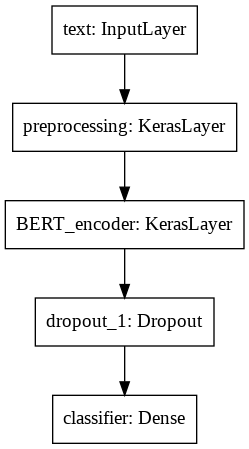

In [ ]:
tf.keras.utils.plot_model(classifier_model)

### BERT Word Embeddings

There are many different ways to represent words as word embeddings. Before BERT, some common ways were to use GloVe or word2vec. 

BERT word embeddings are created by looking at the context of billions of words in billions of sentences and automatically organizing them.

To gain a better understanding of what is going on behind the scenes, lets take a look at what happens to our text when it goes through the embedding process. 

In [ ]:
!pip3 install transformers &> /dev/null
from transformers import BertTokenizer
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

input_sentence = "Hello, my dog Haru is cute"

encoded_sentence = tokenizer(input_sentence, return_tensors="tf")

print("Raw sentence:", input_sentence)
print("Encoded sentence:", encoded_sentence["input_ids"][0].numpy())
print("Decoded encoded sentence:", tokenizer.convert_ids_to_tokens(encoded_sentence["input_ids"][0]))


Raw sentence: Hello, my dog Haru is cute
Encoded sentence: [  101  7592  1010  2026  3899  5292  6820  2003 10140   102]
Decoded encoded sentence: ['[CLS]', 'hello', ',', 'my', 'dog', 'ha', '##ru', 'is', 'cute', '[SEP]']


### Training the Model
You might notice some variables and be wondering what they mean or are used for. Let's cover some of them briefly.
 - The number of epochs is simply how many times the algorithm will make a pass through the dataset to further train the model.
 - The loss refers to the value calculated by the loss function which is charged with calculating the penalty when the model makes a bad prediction. There are [different loss functions](https://www.tensorflow.org/api_docs/python/tf/keras/losses) we can use, but seeing as how this is a binary classifcation problem, meaning there are only two target classes we are trying to predict, we will stick with binary cross-entropy.
 - The optimizer is in charge of changing the weights of the network to reduce the loss. Again, there are [different optimizers](https://www.tensorflow.org/addons/api_docs/python/tfa/optimizers/) that one can use, but we will stick with "adamw" for this demo. Adam has become the de-facto standard and is widley known to produce good results. However, [this doesn't mean other optimizers should be ruled out](https://parameterfree.com/2020/12/06/neural-network-maybe-evolved-to-make-adam-the-best-optimizer/), but that is beyond the scope of this workshop.
 - The learning rate is a hyperparameter that controls how much to change the model in response to the estimated error each time the model weights are updated. This value can be tweeked (but for this exmaple we will stick with 3e-5).
    - A smaller learning rate can allow the model to learn more optimal weights at the cost of a longer training period, but it may also cause it to never converge or get stuck on a sub-optimal solution if it is too small.
    - A higher learning rate allows the model to learn faster at the cost of arriving at a set of less optimal weights, but it may also cause the performance/loss to oscillate across each epoch if it is too large.
 - The number of training steps is how many mini-batches of data will be processed each epoch. For example, if you have 100,000 training samples and you use a batch size of 100, then one epoch will be equivalent to 1000 steps (with 100 samples per step).



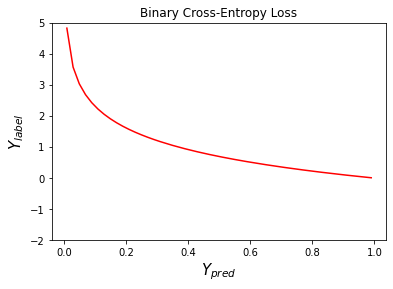


Source: https://medium.com/@risingdeveloper/visualization-of-some-loss-functions-for-deep-learning-with-tensorflow-9f60be9d09f9 

The ground truth in the plot above (i.e., Y_true) is just 1.


        Cross entropy loss for binary classification is used when we are 
        predicting two classes (e.g., 0 and 1).  Here we wish to measure the 
        distance from the actual class (0 or 1) to the predicted value, 
        which is typically a real number between 0 and 1.
    


In [ ]:
#@title Visualizing Different Loss Functions
import matplotlib.pyplot as plt
import tensorflow as tf


ground_truth_note_1 = "The ground truth in the plot above (i.e., Y_true) is just 0."
ground_truth_note_2 = "The ground truth in the plot above (i.e., Y_true) is just 1."
preface = """
Source: https://medium.com/@risingdeveloper/visualization-of-some-loss-functions-for-deep-learning-with-tensorflow-9f60be9d09f9 \n
{0}
"""

loss_function_descriptions = {
    "euclidean/L2": """
        Euclidean/L2 norm loss is used for regression algorithms that predict a 
        continuous number (i.e., the output does not have a finite 
        range). The L2 norm loss is good because it is curved and seems to
        converge near the target. Implementing this can make algorithms 
        converge more slowly when approaching the target and avoid 
        over-shooting the minimum.
    """,
    "absolute/L1": """
        Absolute/L1 norm loss for regression algorithms that predict a 
        continuous number (i.e., the output does not have a finite 
        range). The L1 norm loss is better in detecting outliers than the L2 norm 
        loss because it is not steep for very large values. A major point to note 
        is that L1 norm loss is not smooth when close to the target/minimum and 
        this can cause non-convergence for algorithms.
    """,
    "binary_cross_entropy": """
        Cross entropy loss for binary classification is used when we are 
        predicting two classes (e.g., 0 and 1).  Here we wish to measure the 
        distance from the actual class (0 or 1) to the predicted value, 
        which is typically a real number between 0 and 1.
    """
}


def euclidean():
    Y_pred = tf.linspace(-1., 1., 500)
    Y_truth = tf.constant(0.)
    L2_val = tf.square(Y_truth - Y_pred)

    plt.plot(Y_pred, L2_val, 'b-', label='L2 loss' )
    plt.title('Euclidean Loss')
    plt.xlabel('$Y_{pred}$', fontsize=15)
    plt.ylabel('$Y_{true}$', fontsize=15)
    plt.show()

    print(preface.format(ground_truth_note_1))
    print(loss_function_descriptions[Select_Loss_Function])

def absolute():
    Y_pred = tf.linspace(-1., 1., 500)
    Y_truth = tf.constant(0.)
    L1_val = tf.abs(Y_truth - Y_pred)

    plt.plot(Y_pred, L1_val, 'r-' )
    plt.title('Absolute Loss')
    plt.xlabel('$Y_{pred}$', fontsize=15)
    plt.ylabel('$Y_{true}$', fontsize=15)
    plt.show()

    print(preface.format(ground_truth_note_1))
    print(loss_function_descriptions[Select_Loss_Function])

def binary_cross_entropy():
    Y_pred = tf.linspace(-1., 1., 500)
    Y_truth = tf.constant(0.)
    Y_pred = tf.linspace(-4., 6., 500)
    Y_label = tf.constant(1.)
    Y_labels = tf.fill([500,], 1.)
    x_entropy_loss = - tf.multiply(Y_label, tf.math.log(Y_pred)) - tf.multiply((1. - Y_label), tf.math.log(1. - Y_pred))

    plt.plot(Y_pred, x_entropy_loss, 'r-' )
    plt.title('Binary Cross-Entropy Loss')
    plt.xlabel('$Y_{pred}$', fontsize=15)
    plt.ylabel('$Y_{label}$', fontsize=15)
    plt.ylim(-2, 5)
    plt.show()

    print(preface.format(ground_truth_note_2))
    print(loss_function_descriptions[Select_Loss_Function])


Select_Loss_Function = 'binary_cross_entropy'  #@param ["euclidean/L2", "absolute/L1", "binary_cross_entropy"]

loss_function_selection_map = {
    "euclidean/L2": euclidean,
    "absolute/L1": absolute,
    "binary_cross_entropy": binary_cross_entropy
}

loss_function_selection_map[Select_Loss_Function]()


In [ ]:
#@title Visualizing Optimizers

import IPython

print("""
Source: https://bl.ocks.org/EmilienDupont/aaf429be5705b219aaaf8d691e27ca87

Click anywhere on the function heatmap to start a minimization. You can toggle the different algorithms (SGD, Momentum, RMSProp, Adam) by clicking on the circles in the lower bar.

The global minimum is on the left. A local minimum is found on the right.
Interestingly, different initializations make some algorithms converge to the local minimum while others converge to the global minimum.
""")
IPython.display.HTML(url='https://gist.githubusercontent.com/EmilienDupont/aaf429be5705b219aaaf8d691e27ca87/raw/d5c6bd2483479c8187f5b49e329d84651b930e09/index.html')



Source: https://bl.ocks.org/EmilienDupont/aaf429be5705b219aaaf8d691e27ca87

Click anywhere on the function heatmap to start a minimization. You can toggle the different algorithms (SGD, Momentum, RMSProp, Adam) by clicking on the circles in the lower bar.

The global minimum is on the left. A local minimum is found on the right.
Interestingly, different initializations make some algorithms converge to the local minimum while others converge to the global minimum.



In [ ]:
loss = tf.keras.losses.BinaryCrossentropy(from_logits=True)
metrics = tf.metrics.BinaryAccuracy()

epochs = 5
steps_per_epoch = tf.data.experimental.cardinality(train_ds).numpy()
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

classifier_model.compile(optimizer=optimizer,
                         loss=loss,
                         metrics=metrics)

print(f'Training model with {tfhub_handle_encoder}')
history = classifier_model.fit(x=train_ds,
                               validation_data=val_ds,
                               epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/5
625/625 [==============================] - 105s 158ms/step - loss: 0.5650 - binary_accuracy: 0.6690 - val_loss: 0.3966 - val_binary_accuracy: 0.8336
Epoch 2/5
625/625 [==============================] - 93s 148ms/step - loss: 0.3563 - binary_accuracy: 0.8389 - val_loss: 0.3686 - val_binary_accuracy: 0.8440
Epoch 3/5
625/625 [==============================] - 92s 147ms/step - loss: 0.2705 - binary_accuracy: 0.8812 - val_loss: 0.3990 - val_binary_accuracy: 0.8510
Epoch 4/5
625/625 [==============================] - 91s 146ms/step - loss: 0.2091 - binary_accuracy: 0.9155 - val_loss: 0.4638 - val_binary_accuracy: 0.8480
Epoch 5/5
625/625 [==============================] - 91s 145ms/step - loss: 0.1617 - binary_accuracy: 0.9396 - val_loss: 0.4743 - val_binary_accuracy: 0.8530


### Evaluating the Model
Let's take a look at how our model did while it was being trained. We will observe the accuracy and loss of the model across each of the epochs it was trained. We will also look at the Precision, Recall, and F1-Score which were previously covered.

782/782 [==============================] - 69s 88ms/step - loss: 0.4548 - binary_accuracy: 0.8560
Test Set Loss: 0.4548150897026062
Test Set Accuracy: 0.8559600114822388


dict_keys(['loss', 'binary_accuracy', 'val_loss', 'val_binary_accuracy'])


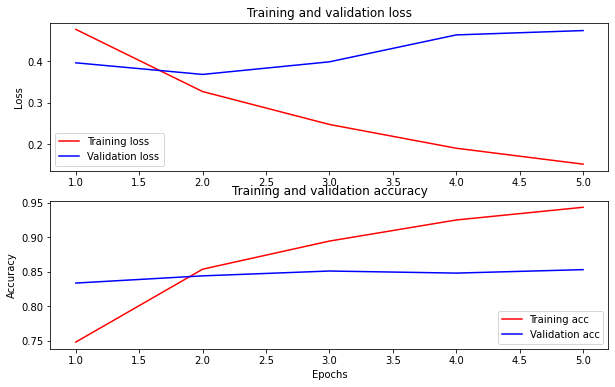

In [ ]:
loss, accuracy = classifier_model.evaluate(test_ds)

print(f'Test Set Loss: {loss}')
print(f'Test Set Accuracy: {accuracy}\n\n')

history_dict = history.history
print(history_dict.keys())

acc = history_dict['binary_accuracy']
val_acc = history_dict['val_binary_accuracy']
loss = history_dict['loss']
val_loss = history_dict['val_loss']

epochs = range(1, len(acc) + 1)
fig = plt.figure(figsize=(10, 6))
fig.tight_layout()

plt.subplot(2, 1, 1)
# "bo" is for "blue dot"
plt.plot(epochs, loss, 'r', label='Training loss')
# b is for "solid blue line"
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
# plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(epochs, acc, 'r', label='Training acc')
plt.plot(epochs, val_acc, 'b', label='Validation acc')
plt.title('Training and validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

In [ ]:
labels = []
for x, y in test_ds.take(-1):
    labels = tf.concat([labels, y], 0)

labels = labels.numpy().tolist()
raw_preds = classifier_model.predict(test_ds)
print(raw_preds)
preds = [0 if x < 0.0 else 1 for x in raw_preds]

print(mt.classification_report(labels, preds, digits=4))

[[-5.7126107]
 [ 5.7974906]
 [ 6.2004857]
 ...
 [ 6.449075 ]
 [ 3.1637645]
 [ 6.106222 ]]
              precision    recall  f1-score   support

           0     0.8569    0.8602    0.8585     12500
           1     0.8596    0.8563    0.8580     12500

    accuracy                         0.8582     25000
   macro avg     0.8582    0.8582    0.8582     25000
weighted avg     0.8582    0.8582    0.8582     25000



### Saving the Model to Disk for Later Use
Below we are setting the name of the model to "imdb_bert" and saving it to the current folder we are working out of.

In [ ]:
dataset_name = 'imdb'
saved_model_path = './{}_bert'.format(dataset_name.replace('/', '_'))

classifier_model.save(saved_model_path, include_optimizer=False)

### Loading the Model From Disk
One function call and our model is ready for use!

In [ ]:
reloaded_model = tf.keras.models.load_model(saved_model_path)

### Using the Loaded Model
Let's try out our loaded model on some examples and see how it scores them.

In [ ]:
def print_my_examples(inputs, results, threshold=0.5):
    result_for_printing = [f'input: {inputs[i]:<25} → score: {results[i][0]:.6f}, verdict: {"positive" if results[i][0] >= threshold else "negative"}' for i in range(len(inputs))]
    print(*result_for_printing, sep='\n')
    print()


examples = [
    'this is an amazing movie!',  # this is the same sentence tried earlier
    'The movie was great!',
    'The movie was meh.',
    'The movie was okish.',
    'The movie was terrible...'
]

reloaded_results = tf.sigmoid(reloaded_model(tf.constant(examples)))

print('Results from the saved model:')
print_my_examples(examples, reloaded_results)

print("Using a threshold of 0.85:")
print_my_examples(examples, reloaded_results, threshold=0.85)

# **Part E: A Dashboard for Mitigating the COVID-19 Misinfodemic**


## **E.1 Stance Detection**

The main goal of stance detection is to determine the attitude expressed in a text towards a topic or a factual claim, such as determining if a tweet expresses a agree, disagree stance towards a political entity or a fact check or just discuss about them. 

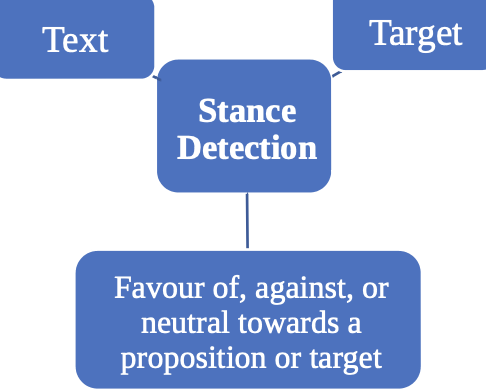

### E1.1 Application of stance detection:

#### Opinion Mining
- Analysing speech of members in different house.
- Analysing employee opinion of an organization towards a new policy.

#### Analysing Debates
- Debate in parliament.
- Analysing conversation between group of people.


#### Feedback system
- Feedback given by a customer on Amazon, Flipkart etc.
- People experience about new product lunched by a company.

#### **Analysing social media.**
- Tweet by tweeter users.
- Post on Instagram and different other socia media platform.

## **E.2 Introduction to IDIR COVID-19 dashboard**
DEMO URL: https://idir.uta.edu/covid-19/

1. Geographic region selection panel.
2. Interactive map.
3. Timeline chart.
4. Panel of facts.
5. Government tweets.
6. Chatbot.

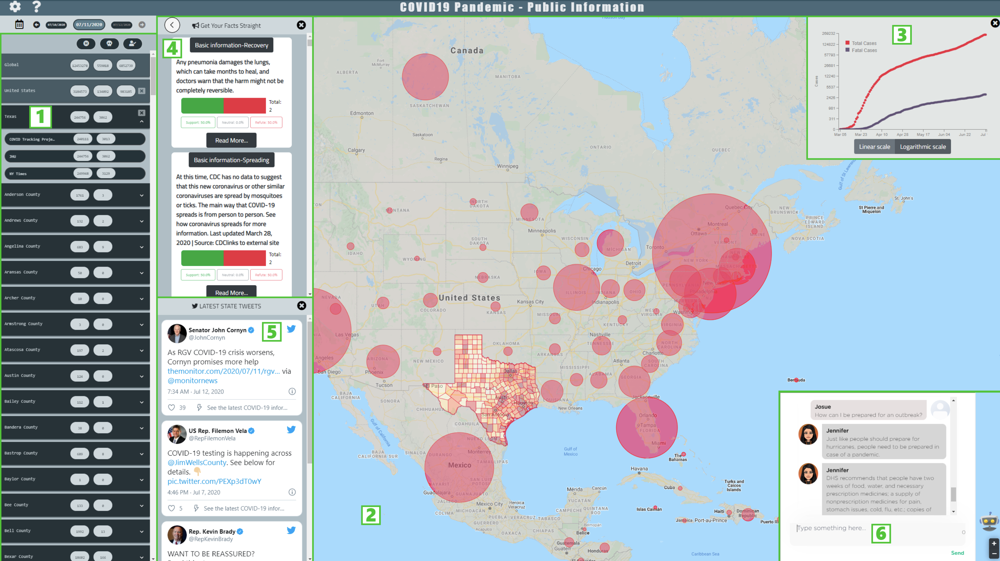

## **E.3 Stance detection practice exercises**

### E3.1 Stance BERT classification workflow
The chart below shows how BERT model apply to our task.

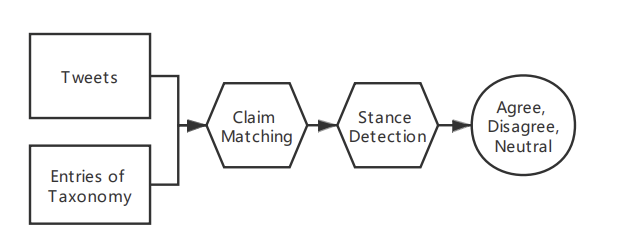

### E3.2 Setup environment and get dataset ready
You need to install tensorflow-text(A dependency of the preprocessing for BERT inputs) and tf-models-official(A dependency of the AdamW optimizer).

In [ ]:
!pip install -q tensorflow-text
!pip install -q tf-models-official

import os
import shutil

import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optmizer

import matplotlib.pyplot as plt

tf.get_logger().setLevel('ERROR')

     |████████████████████████████████| 3.4MB 6.5MB/s 
     |████████████████████████████████| 1.1MB 6.3MB/s 
     |████████████████████████████████| 1.2MB 23.2MB/s 
     |████████████████████████████████| 174kB 17.8MB/s 
     |████████████████████████████████| 37.6MB 82kB/s 
     |████████████████████████████████| 645kB 51.7MB/s 
     |████████████████████████████████| 706kB 55.0MB/s 
     |████████████████████████████████| 358kB 56.6MB/s 
     |████████████████████████████████| 51kB 8.8MB/s 
     |████████████████████████████████| 102kB 13.6MB/s 


Download dataset from the link below and unzip it.

In [ ]:
!wget "https://drive.google.com/uc?export=download&id=1r-0bA2HJRknNvaXbUZB4OsIXMyfi95IM" -O "stance_detection.zip"
!unzip stance_detection.zip

--2021-02-28 18:42:37--  https://drive.google.com/uc?export=download&id=1r-0bA2HJRknNvaXbUZB4OsIXMyfi95IM
Resolving drive.google.com (drive.google.com)... 74.125.202.102, 74.125.202.138, 74.125.202.139, ...
Connecting to drive.google.com (drive.google.com)|74.125.202.102|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0s-5k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/aqcgptmn9rasksdm93nbqe5udc96b588/1614537750000/12977678939721636440/*/1r-0bA2HJRknNvaXbUZB4OsIXMyfi95IM?e=download [following]
--2021-02-28 18:42:39--  https://doc-0s-5k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/aqcgptmn9rasksdm93nbqe5udc96b588/1614537750000/12977678939721636440/*/1r-0bA2HJRknNvaXbUZB4OsIXMyfi95IM?e=download
Resolving doc-0s-5k-docs.googleusercontent.com (doc-0s-5k-docs.googleusercontent.com)... 173.194.74.132, 2607:f8b0:4001:c0d::84
Connecting to doc-0s-5k-docs.googleusercontent.com (doc-0s

Next, you will use the text_dataset_from_directory utility to create a `tf.data.Dataset` object.

In [ ]:
import os
import shutil
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_text as text
from official.nlp import optimization  # to create AdamW optmizer

import matplotlib.pyplot as plt

tf.get_logger().setLevel('ERROR')

AUTOTUNE = tf.data.AUTOTUNE
seed = 42

raw_train_ds = tf.keras.preprocessing.text_dataset_from_directory(
    'stance_detection/train',
    batch_size=2,
    seed=seed)

class_names = raw_train_ds.class_names
train_ds = raw_train_ds.cache().prefetch(buffer_size=AUTOTUNE)

test_ds = tf.keras.preprocessing.text_dataset_from_directory(
    'stance_detection/test',
    batch_size=2)

test_ds = test_ds.cache().prefetch(buffer_size=AUTOTUNE)

Found 145 files belonging to 3 classes.
Found 33 files belonging to 3 classes.


Let's take a look at a few tweet-fact pairs.

In [ ]:
for text_batch, label_batch in train_ds.take(3):
  for i in range(2):
    print(f'Tweet-fact pair: {text_batch.numpy()[i]}')
    label = label_batch.numpy()[i]
    print(f'Label : {label} ({class_names[label]})')

Tweet-fact pair: b'@klustout #HongKongers request for full border closure to block all mainlanders until the end of Wuhan pneumonia but Carrie Lam doesn\xe2\x80\x99t care what the people want ! |  To help prevent the introduction of Coronavirus into our border facilities and into our country, illegal aliens subject to the order will not be held by CBP, and instead will immediately be turned away from ports of entry. Those encountered between ports of entry after illegally crossing the border similarly will not be held for processing and instead, will immediately be returned to their country of last transit. These aliens are processed in stations designed for short-term processing, where distancing is not a viable option, creating serious danger of an outbreak.  Last updated March 31, 2020     | Source:                  DHSlinks to external site  '
Label : 0 (agree)
Tweet-fact pair: b"There's No Quality Data Showing Hydroxychloroquine and Chloroquine Can Help COVID-19 Patients, Scientis

### E3.3 Prepare stance BERT to make predictions

Prepare the stance BERT model

Here you can choose which BERT model you will load from TensorFlow Hub and fine-tune. There are multiple BERT models available:

In [ ]:
#@title Choose a BERT model to fine-tune

bert_model_name = 'small_bert/bert_en_uncased_L-4_H-512_A-8'  #@param ["bert_en_uncased_L-12_H-768_A-12", "bert_en_cased_L-12_H-768_A-12", "bert_multi_cased_L-12_H-768_A-12", "small_bert/bert_en_uncased_L-2_H-128_A-2", "small_bert/bert_en_uncased_L-2_H-256_A-4", "small_bert/bert_en_uncased_L-2_H-512_A-8", "small_bert/bert_en_uncased_L-2_H-768_A-12", "small_bert/bert_en_uncased_L-4_H-128_A-2", "small_bert/bert_en_uncased_L-4_H-256_A-4", "small_bert/bert_en_uncased_L-4_H-512_A-8", "small_bert/bert_en_uncased_L-4_H-768_A-12", "small_bert/bert_en_uncased_L-6_H-128_A-2", "small_bert/bert_en_uncased_L-6_H-256_A-4", "small_bert/bert_en_uncased_L-6_H-512_A-8", "small_bert/bert_en_uncased_L-6_H-768_A-12", "small_bert/bert_en_uncased_L-8_H-128_A-2", "small_bert/bert_en_uncased_L-8_H-256_A-4", "small_bert/bert_en_uncased_L-8_H-512_A-8", "small_bert/bert_en_uncased_L-8_H-768_A-12", "small_bert/bert_en_uncased_L-10_H-128_A-2", "small_bert/bert_en_uncased_L-10_H-256_A-4", "small_bert/bert_en_uncased_L-10_H-512_A-8", "small_bert/bert_en_uncased_L-10_H-768_A-12", "small_bert/bert_en_uncased_L-12_H-128_A-2", "small_bert/bert_en_uncased_L-12_H-256_A-4", "small_bert/bert_en_uncased_L-12_H-512_A-8", "small_bert/bert_en_uncased_L-12_H-768_A-12", "albert_en_base", "electra_small", "electra_base", "experts_pubmed", "experts_wiki_books", "talking-heads_base"]

map_name_to_handle = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_L-12_H-768_A-12/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_L-12_H-768_A-12/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_L-12_H-768_A-12/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-2_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-6_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-8_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-10_H-768_A-12/1',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-128_A-2/1',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-256_A-4/1',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-512_A-8/1',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-12_H-768_A-12/1',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_base/2',
    'electra_small':
        'https://tfhub.dev/google/electra_small/2',
    'electra_base':
        'https://tfhub.dev/google/electra_base/2',
    'experts_pubmed':
        'https://tfhub.dev/google/experts/bert/pubmed/2',
    'experts_wiki_books':
        'https://tfhub.dev/google/experts/bert/wiki_books/2',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/talkheads_ggelu_bert_en_base/1',
}

map_model_to_preprocess = {
    'bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_en_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_cased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-2_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-4_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-6_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-8_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-10_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-128_A-2':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-256_A-4':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-512_A-8':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'small_bert/bert_en_uncased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'bert_multi_cased_L-12_H-768_A-12':
        'https://tfhub.dev/tensorflow/bert_multi_cased_preprocess/3',
    'albert_en_base':
        'https://tfhub.dev/tensorflow/albert_en_preprocess/2',
    'electra_small':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'electra_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_pubmed':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'experts_wiki_books':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
    'talking-heads_base':
        'https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3',
}

tfhub_handle_encoder = map_name_to_handle[bert_model_name]
tfhub_handle_preprocess = map_model_to_preprocess[bert_model_name]

print(f'BERT model selected           : {tfhub_handle_encoder}')
print(f'Preprocess model auto-selected: {tfhub_handle_preprocess}')

BERT model selected           : https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Preprocess model auto-selected: https://tfhub.dev/tensorflow/bert_en_uncased_preprocess/3


Text inputs need to be transformed to numeric token ids and arranged in several Tensors before being input to BERT. TensorFlow Hub provides a matching preprocessing model for each of the BERT models discussed above, which implements this transformation using TF ops from the TF.text library. It is not necessary to run pure Python code outside your TensorFlow model to preprocess text.

In [ ]:
bert_preprocess_model = hub.KerasLayer(tfhub_handle_preprocess)

Let's try the preprocessing model on some text and see the output:

In [ ]:
text_test = ['this is a tweet']
text_preprocessed = bert_preprocess_model(text_test)

print(f'Keys       : {list(text_preprocessed.keys())}')
print(f'Shape      : {text_preprocessed["input_word_ids"].shape}')
print(f'Word Ids   : {text_preprocessed["input_word_ids"][0, :12]}')
print(f'Input Mask : {text_preprocessed["input_mask"][0, :12]}')
print(f'Type Ids   : {text_preprocessed["input_type_ids"][0, :12]}')

Keys       : ['input_word_ids', 'input_mask', 'input_type_ids']
Shape      : (1, 128)
Word Ids   : [  101  2023  2003  1037  1056 28394  2102   102     0     0     0     0]
Input Mask : [1 1 1 1 1 1 1 1 0 0 0 0]
Type Ids   : [0 0 0 0 0 0 0 0 0 0 0 0]


In [ ]:
bert_model = hub.KerasLayer(tfhub_handle_encoder)

In [ ]:
def build_classifier_model():
  text_input = tf.keras.layers.Input(shape=(), dtype=tf.string, name='text')
  preprocessing_layer = hub.KerasLayer(tfhub_handle_preprocess, name='preprocessing')
  encoder_inputs = preprocessing_layer(text_input)
  encoder = hub.KerasLayer(tfhub_handle_encoder, trainable=True, name='BERT_encoder')
  outputs = encoder(encoder_inputs)
  net = outputs['pooled_output']
  net = tf.keras.layers.Dropout(0.1)(net)
  net = tf.keras.layers.Dense(3, activation='softmax', name='classifier')(net)
  return tf.keras.Model(text_input, net)

classifier_model = build_classifier_model()
bert_raw_result = classifier_model(tf.constant(text_test))
print(bert_raw_result)

tf.Tensor([[0.12980363 0.12896591 0.7412304 ]], shape=(1, 3), dtype=float32)


In [ ]:
tf.keras.utils.plot_model(classifier_model)
classifier_model.summary()

Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
text (InputLayer)               [(None,)]            0                                            
__________________________________________________________________________________________________
preprocessing (KerasLayer)      {'input_word_ids': ( 0           text[0][0]                       
__________________________________________________________________________________________________
BERT_encoder (KerasLayer)       {'encoder_outputs':  28763649    preprocessing[0][0]              
                                                                 preprocessing[0][1]              
                                                                 preprocessing[0][2]              
______________________________________________________________________________________________

### E3.4 Fit the model to the data and make a prediction

#### Loss function
Since this is a multi-class classification problem and the model outputs a probability distribution, you'll use `tf.keras.losses.SparseCategoricalCrossentropy` loss function.


In [ ]:
loss = tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True)
metrics = tf.metrics.SparseCategoricalAccuracy()

#### Optimizer
For optimizer, let's use the same optimizer that BERT was originally trained with: the "Adaptive Moments" (Adam). This optimizer minimizes the prediction loss and does regularization by weight decay (not using moments), which is also known as AdamW.

For the learning rate (init_lr), we use the same schedule as BERT pre-training: linear decay of a notional initial learning rate, prefixed with a linear warm-up phase over the first 10% of training steps (num_warmup_steps). In line with the BERT paper, the initial learning rate is smaller for fine-tuning (best of 5e-5, 3e-5, 2e-5).

In [ ]:
epochs = 10
steps_per_epoch = tf.data.experimental.cardinality(train_ds).numpy()
num_train_steps = steps_per_epoch * epochs
num_warmup_steps = int(0.1*num_train_steps)

init_lr = 3e-5
optimizer = optimization.create_optimizer(init_lr=init_lr,
                                          num_train_steps=num_train_steps,
                                          num_warmup_steps=num_warmup_steps,
                                          optimizer_type='adamw')

Using the classifier_model you created earlier, you can compile the model with the loss, metric and optimizer.

In [ ]:
classifier_model.compile(optimizer=optimizer,
                         loss=loss,
                         metrics=metrics)

print(f'Training model with {tfhub_handle_encoder}')
history = classifier_model.fit(x=train_ds, epochs=epochs)

Training model with https://tfhub.dev/tensorflow/small_bert/bert_en_uncased_L-4_H-512_A-8/1
Epoch 1/10
73/73 [==============================] - 8s 34ms/step - loss: 1.2361 - sparse_categorical_accuracy: 0.4102
Epoch 2/10
73/73 [==============================] - 2s 32ms/step - loss: 1.0641 - sparse_categorical_accuracy: 0.6382
Epoch 3/10
73/73 [==============================] - 2s 32ms/step - loss: 1.0270 - sparse_categorical_accuracy: 0.6549
Epoch 4/10
73/73 [==============================] - 2s 32ms/step - loss: 0.6786 - sparse_categorical_accuracy: 0.7282
Epoch 5/10
73/73 [==============================] - 2s 32ms/step - loss: 0.5850 - sparse_categorical_accuracy: 0.7772
Epoch 6/10
73/73 [==============================] - 2s 32ms/step - loss: 0.3865 - sparse_categorical_accuracy: 0.8460
Epoch 7/10
73/73 [==============================] - 2s 32ms/step - loss: 0.2431 - sparse_categorical_accuracy: 0.8895
Epoch 8/10
73/73 [==============================] - 2s 33ms/step - loss: 0.1404 - 

Let's see how the model performs. Two values will be returned. Loss (a number which represents the error, lower values are better), and accuracy.

In [ ]:
loss, accuracy = classifier_model.evaluate(test_ds)

print(f'Loss: {loss}')
print(f'Accuracy: {accuracy}')

17/17 [==============================] - 1s 12ms/step - loss: 3.2817 - sparse_categorical_accuracy: 0.3636
Loss: 3.281689167022705
Accuracy: 0.3636363744735718


### E3.5 Plot the accuracy and loss over time
Based on the History object returned by model.fit(). You can plot the training and validation loss for comparison, as well as the training and validation accuracy:

dict_keys(['loss', 'sparse_categorical_accuracy'])


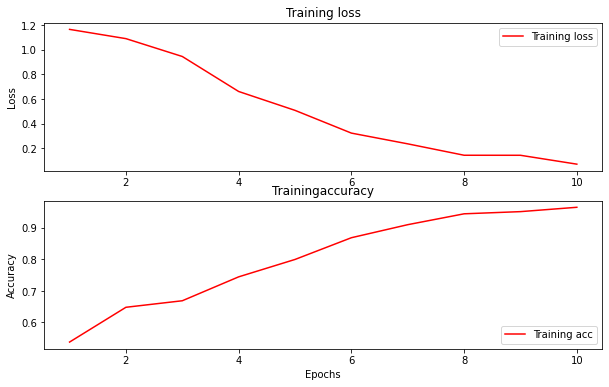

In [ ]:
history_dict = history.history
print(history_dict.keys())

acc = history_dict['sparse_categorical_accuracy']
loss = history_dict['loss']

epochs = range(1, len(acc) + 1)
fig = plt.figure(figsize=(10, 6))
fig.tight_layout()

plt.subplot(2, 1, 1)
plt.plot(epochs, loss, 'r', label='Training loss')
plt.title('Training loss')
plt.ylabel('Loss')
plt.legend()

plt.subplot(2, 1, 2)
plt.plot(epochs, acc, 'r', label='Training acc')
plt.title('Trainingaccuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend(loc='lower right')

### E3.6 Export for inference

Now you just save your fine-tuned model for later use.

In [ ]:
dataset_name = 'stance_detection'
saved_model_path = './{}_bert'.format(dataset_name.replace('/', '_'))

classifier_model.save(saved_model_path, include_optimizer=False)

Let's reload the model so you can try it side by side with the model that is still in memory.

In [ ]:
reloaded_model = tf.saved_model.load(saved_model_path)

Next, you need to dowload the dataset for inference and apply the trained model on it.

In [ ]:
!wget "https://drive.google.com/uc?export=download&id=1pxaxus-AjI48yQugUCziHiqnR7cdsorL" -O "science_report_dataset.zip"
!unzip science_report_dataset.zip

--2021-02-28 00:02:01--  https://drive.google.com/uc?export=download&id=1pxaxus-AjI48yQugUCziHiqnR7cdsorL
Resolving drive.google.com (drive.google.com)... 74.125.20.100, 74.125.20.138, 74.125.20.102, ...
Connecting to drive.google.com (drive.google.com)|74.125.20.100|:443... connected.
HTTP request sent, awaiting response... 302 Moved Temporarily
Location: https://doc-0k-5k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/1b25962occlfeucgl949a1dmi74thoko/1614470550000/12977678939721636440/*/1pxaxus-AjI48yQugUCziHiqnR7cdsorL?e=download [following]
--2021-02-28 00:02:30--  https://doc-0k-5k-docs.googleusercontent.com/docs/securesc/ha0ro937gcuc7l7deffksulhg5h7mbp1/1b25962occlfeucgl949a1dmi74thoko/1614470550000/12977678939721636440/*/1pxaxus-AjI48yQugUCziHiqnR7cdsorL?e=download
Resolving doc-0k-5k-docs.googleusercontent.com (doc-0k-5k-docs.googleusercontent.com)... 74.125.195.132, 2607:f8b0:400e:c09::84
Connecting to doc-0k-5k-docs.googleusercontent.com (doc-0k-5k-

Let's see some data examples and inference results here:

In [ ]:
import pandas as pd

def print_my_examples(inputs, results):
  for i in range(len(inputs)):
      print("input: {}: \npredict class: {}".format(inputs[i], results[i]))
  print()


df = pd.read_csv('./processed/2020-03-24_to_2020-04-01_ennonrt_3_stnc_dtctn.csv')
df.head()
df = df[['TweetText', 'Fact']]
examples = []
for idx, row in df.iterrows():
    txt = ' | '.join([row['TweetText'], row['Fact']])
    examples.append(txt)
examples = examples[0:10]
reloaded_results = tf.argmax(reloaded_model(tf.constant(examples)), 1)

print('Results from the model in memory:')
print_my_examples(examples, reloaded_results)

Results from the model in memory:
input: Do you know a child or young person who may be feeling anxious about COVID-19? Resources are now available on our website to support your conversations on what they need to know about the virus. Visit https://t.co/QO4J2cF86d https://t.co/AipD3cDLjj | If you are feeling ill with COVID-19 symptoms (such as fever, cough, difficulty breathing, muscle pain or general weakness), it is recommended that you contact your local healthcare services online or by telephone. If your healthcare provider believes there is a need for a laboratory test for the virus that causes COVID-19, he/she will inform you of the procedure to follow and advise where and how the test can be performed.: 
predict class: 0
input: #diamonds #jewelry Stock Losses Worsen as Oil Drops, Dow Down 900 Points: Stocks slashed their earlier gains on Friday as investors concluded a week of wild swings. Wall Street has been grappling with fears over the coronavirus’ https://t.co/3F5KDlcHEs h

In [ ]:
import glob

final_results = []
paths = glob.glob('./processed/*')

for p in paths:
    df = pd.read_csv(p)
    df = df[['TweetText', 'Fact']]
    examples = []
    for idx, row in df.iterrows():
        txt = ' | '.join([row['TweetText'], row['Fact']])
        examples.append(txt)

    reloaded_results = tf.argmax(reloaded_model(tf.constant(examples)), 1)
    print(reloaded_results)
    break

tf.Tensor(
[2 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 1 0 1 0 0
 2 0 0 0 0 0 2 0 0 0 0 0 0 2 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0
 2 2 0 0 0 2 0 1 0 0 0 0 0 2 0 0 0 0 0 0 0 0 2 2 0 0 0 0 0 0 0 0 0 1 0 0 0
 2 2 0 0 0 0 0 0 0 0 0 2 0 0 1 0 1 0 0 0 0 0 0 0 0 0 1 2 2 0 1 0 0 0 2 0 0
 0 0 2 0 0 2 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0
 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 2 0 0 2 1 0 0 0 0 0 2
 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 1 0 0 0 0 0 0 0 0 1 2 0 0 0 0 0 2
 0 0 0 2 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 1 0 0 0 0 0
 1 0 0 0 2 0 0 0 0 0 0 0 0 2 0 0 0 0 0 2 0 0 0 0 0 0 0 2 0 0 0 0 0 0 0 0 0
 0 0 0 1 0 0 2 0 0 0 0 2 2 2 2 2 2 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0
 0 2 2 0 0 0 0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0 1 0 2 2 0 0 0 0 0 0 0
 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2 0 0 2 2 0 0 0 0 0 0 0 0 0 0 0 0 0 0 0 2
 0 0 1 0 2 2 2 1 0 2 0 0 0 0 2 0 0 2 0 2 0 0 0 0 0 0 0 0 0 0 0 2 0 0 0 0 0
 2 0 0 0 0 0 0

## **E.5 Presentation preparation**
 Let students to prepare their presentation.

## Reference

- https://stackabuse.com/python-for-nlp-tokenization-stemming-and-lemmatization-with-spacy-library/
- https://www.kdnuggets.com/2019/04/text-preprocessing-nlp-machine-learning.html
- https://monkeylearn.com/text-classification/
- https://monkeylearn.com/what-is-text-classification/